In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import anndata 
from scipy.sparse import csr_matrix
import matplotlib.pyplot as plt

import seaborn as sns
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors

# Para pseudotime con PAGA (Scanpy tiene métodos similares a Monocle3)
import scanpy.external as sce

import palantir
import palantir.utils as utils
from sklearn.decomposition import PCA
from palantir.presults import compute_gene_trends

from pygam import GAM, s
from statsmodels.stats.multitest import multipletests
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import pdist, squareform

from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
SEED = 42
sc.settings.seed = SEED
np.random.seed(SEED)
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)

# The environment is in conda bash in Windows

In [2]:
import loompy
# 1. Abrir archivo loom
ds = loompy.connect("/lustre1/project/stg_00135/Cecilia/Data/SCENIC/all.both.patients_pySCENIC.loom", mode='r', validate=False)

# 2. Extraer matriz genes x células
X = ds[:, :]

# 3. Extraer metadatos de genes (rows)
var = pd.DataFrame({'Gene': ds.ra['Gene']})

# 4. Extraer metadatos de células (columns)
obs = pd.DataFrame({key: ds.ca[key] for key in ds.ca.keys()})

# 5. Guardar regulones (tuplas) en uns
regulons_tuples = ds.ra['Regulons']

ds.close()

# Para obs y var:
obs.index = obs.index.astype(str)
var.index = var.index.astype(str)
# 6. Crear objeto AnnData
adata = anndata.AnnData(X=X.T, var=var, obs=obs)

# 7. Guardar regulones en adata.uns
adata.uns['Regulons_tuples'] = regulons_tuples

# 8. Columnas complejas para mover a .obsm
cols_complex = ['Clusterings', 'Embedding', 'Embeddings_X', 'Embeddings_Y', 'RegulonsAUC']

# 9. Mover columnas complejas de obs a obsm
for col in cols_complex:
    adata.obsm[col] = np.array(adata.obs[col].tolist(), dtype=object) 
    del adata.obs[col]

# 10. Verificación
adata


AnnData object with n_obs × n_vars = 72733 × 26156
    obs: 'AvgDistanceToRef', 'CellID', 'RNA_MERGED_clusters', 'nCount_RNA', 'nGene', 'nUMI', 'percent.mito', 'predicted.celltype.l1', 'predicted.celltype.l2', 'subsample'
    var: 'Gene'
    uns: 'Regulons_tuples'
    obsm: 'Clusterings', 'Embedding', 'Embeddings_X', 'Embeddings_Y', 'RegulonsAUC'

In [3]:
adata.obs.set_index('CellID', inplace=True)
adata.var.set_index('Gene', inplace=True)

In [4]:
adata.obs["predicted.celltype.l1"].value_counts()

predicted.celltype.l1
Mono       37812
CD8 T      15019
B           6358
CD4 T       5735
NK          5094
DC          1109
other T      996
other        610
Name: count, dtype: int64

# Segmented cells from l1

In [5]:
"""cd4_adata = adata[adata[:, "CD4"].X.toarray().flatten() > 0, :].copy()"""

'cd4_adata = adata[adata[:, "CD4"].X.toarray().flatten() > 0, :].copy()'

In [6]:
cd4_adata = adata[adata.obs['predicted.celltype.l1'] == "CD4 T"].copy()

In [7]:
cd4_adata

AnnData object with n_obs × n_vars = 5735 × 26156
    obs: 'AvgDistanceToRef', 'RNA_MERGED_clusters', 'nCount_RNA', 'nGene', 'nUMI', 'percent.mito', 'predicted.celltype.l1', 'predicted.celltype.l2', 'subsample'
    uns: 'Regulons_tuples'
    obsm: 'Clusterings', 'Embedding', 'Embeddings_X', 'Embeddings_Y', 'RegulonsAUC'

In [8]:
cd4_adata.obs['subsample'].value_counts()

subsample
d. Pre-Treatment P123RS    1488
c. 4 Months P116RS         1134
f. 4 Months P123RS         1123
e. 1 Week P123RS            835
b. 1 Week P116RS            692
a. Pre-Treatment P116RS     463
Name: count, dtype: int64

In [9]:
# Patient p123
adata_p123 = cd4_adata[cd4_adata.obs["subsample"].str.contains("P123RS")].copy()

In [10]:
adata_p123.obsm['Clusterings'].shape

(3446, 1)

In [11]:
# check if CD14 gene is in var
if "CD14" in adata_p123.var_names:
    # keep the cells that do not express CD14
    adata_p123 = adata_p123[adata_p123[:, "CD14"].X.toarray().flatten() == 0, :].copy()
else:
    print("El gen CD14 no está en adata_p123.var_names")

In [12]:
adata_p123 = adata_p123[adata_p123.obs["predicted.celltype.l2"] != "CD14 Mono"].copy()
adata_p123.obs["predicted.celltype.l2"].value_counts()

predicted.celltype.l2
CD4 TCM              1877
CD4 TEM               820
Treg                  286
CD4 Naive              89
dnT                    80
CD4 CTL                39
CD4 Proliferating      38
CD8 TEM                32
CD8 Naive              12
Platelet               10
MAIT                    4
B intermediate          3
CD8 TCM                 3
gdT                     2
ILC                     1
Name: count, dtype: int64

In [13]:
adata_p123

AnnData object with n_obs × n_vars = 3296 × 26156
    obs: 'AvgDistanceToRef', 'RNA_MERGED_clusters', 'nCount_RNA', 'nGene', 'nUMI', 'percent.mito', 'predicted.celltype.l1', 'predicted.celltype.l2', 'subsample'
    uns: 'Regulons_tuples'
    obsm: 'Clusterings', 'Embedding', 'Embeddings_X', 'Embeddings_Y', 'RegulonsAUC'

In [14]:
adata_p123.obsm['Clusterings'].shape

(3296, 1)

In [15]:
adata_p123 = adata_p123[adata_p123.obs["percent.mito"] <= 5].copy()

<Axes: >

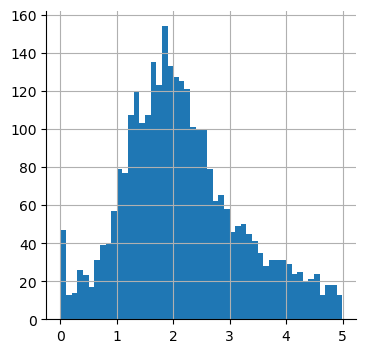

In [16]:
adata_p123.obs["percent.mito"].hist(bins=50)

In [17]:
sc.pp.filter_genes(adata_p123, min_cells=3)

filtered out 9798 genes that are detected in less than 3 cells


In [18]:
adata_p123.obsm['Clusterings'].shape

(2975, 1)

In [19]:
# Normalizing to median total counts
sc.pp.normalize_total(adata_p123)
# Logarithmize the data
sc.pp.log1p(adata_p123)

normalizing counts per cell
    finished (0:00:00)


In [20]:
sc.pp.highly_variable_genes(adata_p123, flavor="seurat", n_top_genes=1500)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [21]:
sc.pp.pca(adata_p123, n_comps=50)

computing PCA
    with n_comps=50
    finished (0:00:00)


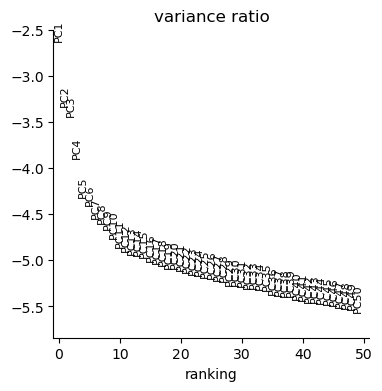

In [22]:
sc.pl.pca_variance_ratio(adata_p123, n_pcs=50, log=True)

In [23]:
sc.pp.neighbors(adata_p123)
sc.tl.umap(adata_p123)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:08)


In [24]:
adata_p123

AnnData object with n_obs × n_vars = 2975 × 16358
    obs: 'AvgDistanceToRef', 'RNA_MERGED_clusters', 'nCount_RNA', 'nGene', 'nUMI', 'percent.mito', 'predicted.celltype.l1', 'predicted.celltype.l2', 'subsample'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Regulons_tuples', 'log1p', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'Clusterings', 'Embedding', 'Embeddings_X', 'Embeddings_Y', 'RegulonsAUC', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [25]:
adata_p123.obsm['Clusterings'].shape

(2975, 1)

In [26]:
adata_p123.obs.shape

(2975, 9)

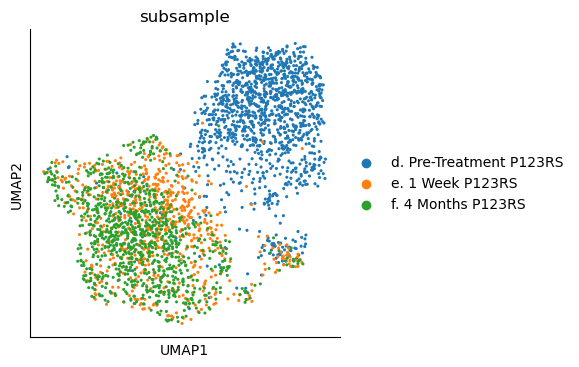

In [27]:
sc.settings.figdir = "/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P123_CD4/"
sc.pl.umap(
    adata_p123,
    color="subsample",
    # Setting a smaller point size to get prevent overlap
    size=20, save = '_subsample.pdf', show = True
)

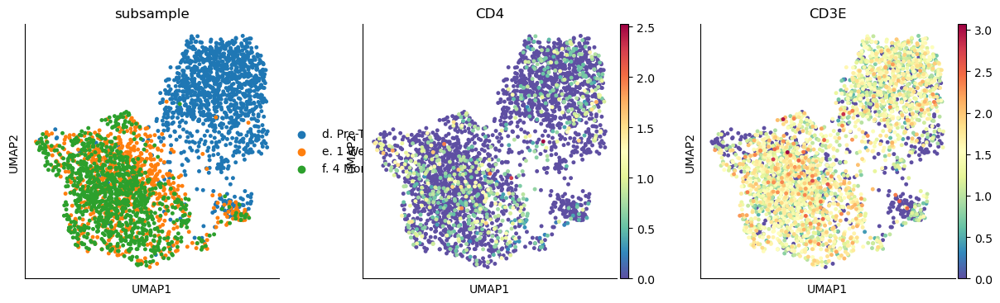

In [28]:
sc.pl.umap(
    adata_p123,
    color=["subsample", "CD4", "CD3E"],
    # Setting a smaller point size to get prevent overlap
    size=50,
)

running Leiden clustering


/tmp/ipykernel_1482857/3612633182.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_p123, resolution = 1.0)


    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


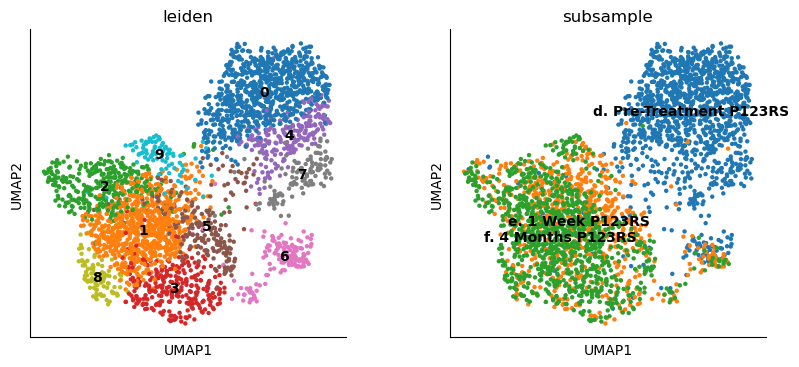

In [29]:
sc.tl.leiden(adata_p123, resolution = 1.0)
sc.pl.umap(adata_p123, color=["leiden", "subsample"], legend_loc="on data")

In [30]:
for res in [0.30, 0.5, 0.8]:
    sc.tl.leiden(adata_p123, resolution=res, key_added=f"leiden_res_{res:.2f}")

running Leiden clustering
    finished: found 3 clusters and added
    'leiden_res_0.30', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden_res_0.50', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden_res_0.80', the cluster labels (adata.obs, categorical) (0:00:00)


In [31]:
adata_p123

AnnData object with n_obs × n_vars = 2975 × 16358
    obs: 'AvgDistanceToRef', 'RNA_MERGED_clusters', 'nCount_RNA', 'nGene', 'nUMI', 'percent.mito', 'predicted.celltype.l1', 'predicted.celltype.l2', 'subsample', 'leiden', 'leiden_res_0.30', 'leiden_res_0.50', 'leiden_res_0.80'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Regulons_tuples', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'subsample_colors', 'leiden', 'leiden_colors', 'leiden_res_0.30', 'leiden_res_0.50', 'leiden_res_0.80'
    obsm: 'Clusterings', 'Embedding', 'Embeddings_X', 'Embeddings_Y', 'RegulonsAUC', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

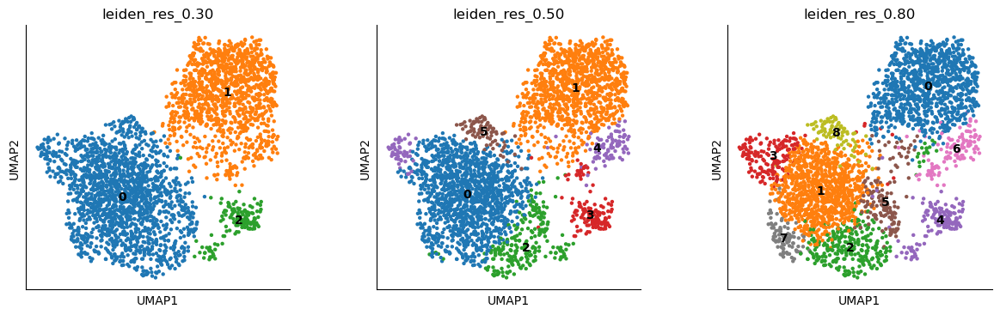

In [32]:
sc.pl.umap(
    adata_p123,
    color=["leiden_res_0.30", "leiden_res_0.50", "leiden_res_0.80"],
    legend_loc="on data",
)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


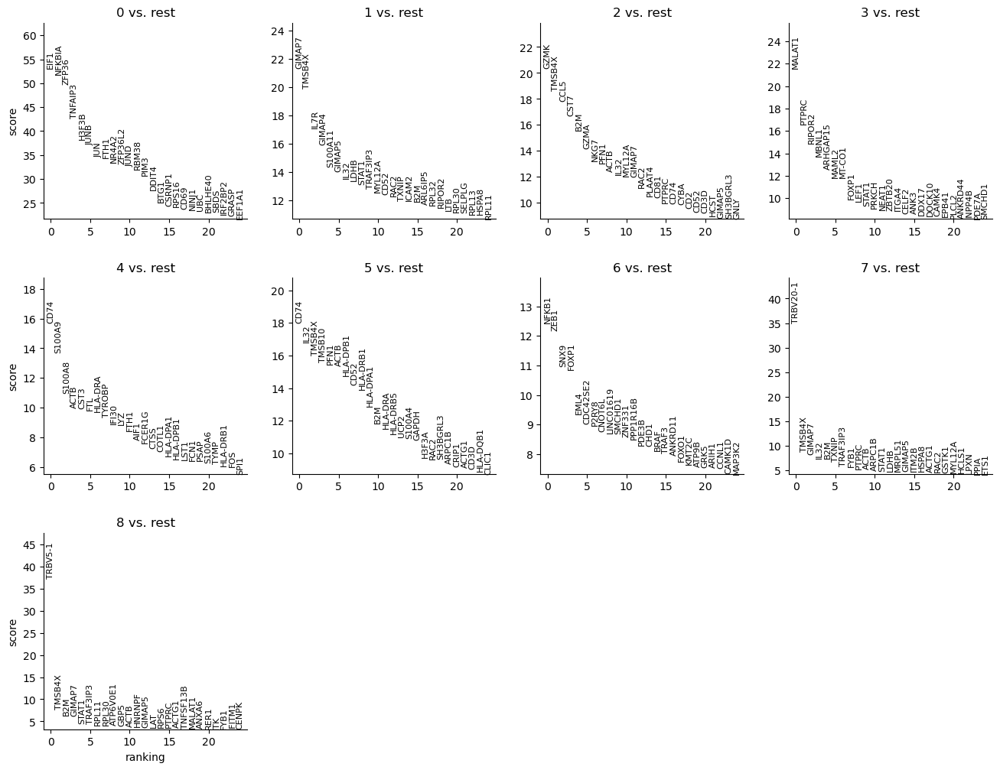

In [33]:
sc.tl.rank_genes_groups(adata_p123, "leiden_res_0.80", method="t-test")
sc.pl.rank_genes_groups(adata_p123, n_genes=25, sharey=False)

In [34]:
sc.tl.rank_genes_groups(adata_p123, groupby="leiden_res_0.80", method="wilcoxon")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_res_0.80']`


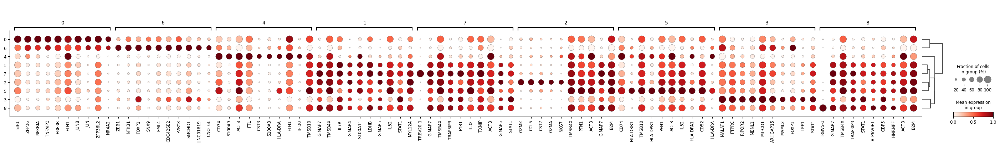

In [35]:
sc.pl.rank_genes_groups_dotplot(
    adata_p123, groupby="leiden_res_0.80", standard_scale="var", n_genes=10)

In [36]:
sc.get.rank_genes_groups_df(adata_p123, group="5").head(40)

,names,scores,logfoldchanges,pvals,pvals_adj
0,CD74,13.054875,1.618867,5.960776e-39,4.951132e-35
1,HLA-DRB1,13.053699,2.937873,6.053468e-39,4.951132e-35
2,TMSB10,12.548202,1.043471,4.066431e-36,2.217289e-32
3,HLA-DPB1,12.342946,1.997634,5.317395e-35,2.174549e-31
4,PFN1,11.952312,1.099485,6.314335e-33,2.065798e-29
5,ACTB,11.861820,1.103011,1.868674e-32,5.094627e-29
6,IL32,11.767445,1.449660,5.743779e-32,1.342239e-28
7,HLA-DPA1,11.588709,1.909640,4.701647e-31,9.613693e-28
8,CD52,11.374972,1.160110,5.572069e-30,1.012754e-26
9,HLA-DRA,11.340993,2.337991,8.220647e-30,1.344734e-26


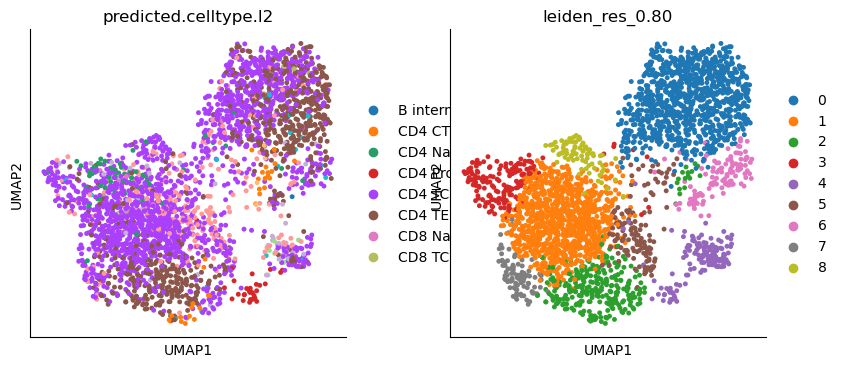

In [37]:
sc.pl.umap(adata_p123, color= [ "predicted.celltype.l2", "leiden_res_0.80"], size=50)

In [38]:
adata_p123.obs["cell_type_lvl1"] = adata_p123.obs["leiden_res_0.80"].map(
    {
        "0": "Teff",
        "1": "TEM",
        "2": "Teff",
        "3": "Quiescent",
        "4": "Teff",
        "5": "Teff",
        "6": "Teff",
        "7": "TEM",
        "8": "TEM"
    }
)



In [39]:
adata_p123.obs["cell_type_lvl1"].value_counts()


cell_type_lvl1
Teff         1686
TEM          1123
Quiescent     166
Name: count, dtype: int64

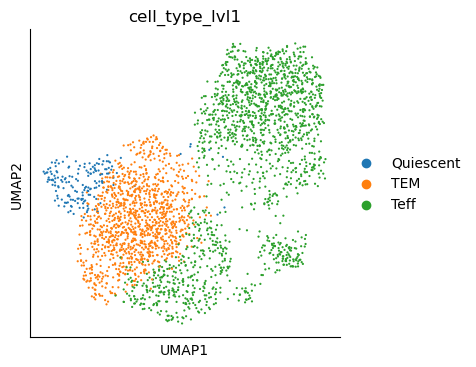

In [40]:
sc.pl.umap(adata_p123, color="cell_type_lvl1", size=10, save = '_celltypelvl1.pdf', show = True)


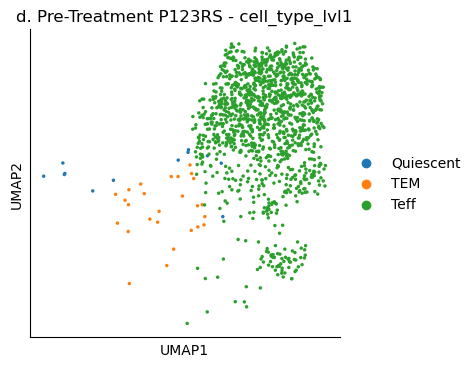

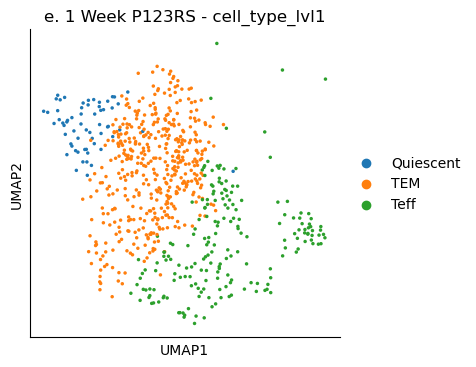

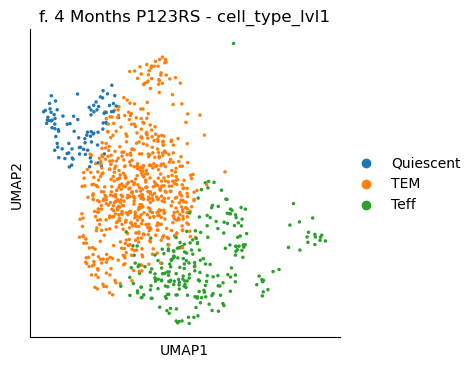

In [41]:
# Asegúrate de reemplazar 'subsample' con el nombre real de la columna
# que identifica las submuestras en adata_p116.obs
subsample_col = 'subsample'

# Itera sobre cada submuestra y genera un UMAP
for sample in adata_p123.obs[subsample_col].unique():
    adata_sub = adata_p123[adata_p123.obs[subsample_col] == sample]
    
    # Genera el UMAP coloreado por cell_type_lvl1
    sc.pl.umap(
        adata_sub,
        color="cell_type_lvl1",
        legend_loc='right margin',
        size=25,
        title=f"{sample} - cell_type_lvl1"
    )

In [42]:
import pandas as pd
counts = pd.crosstab(adata_p123.obs['cell_type_lvl1'], adata_p123.obs['subsample'], dropna=False)
counts

subsample,d. Pre-Treatment P123RS,e. 1 Week P123RS,f. 4 Months P123RS
cell_type_lvl1,,,
Quiescent,12,61,93
TEM,26,447,650
Teff,1237,199,250


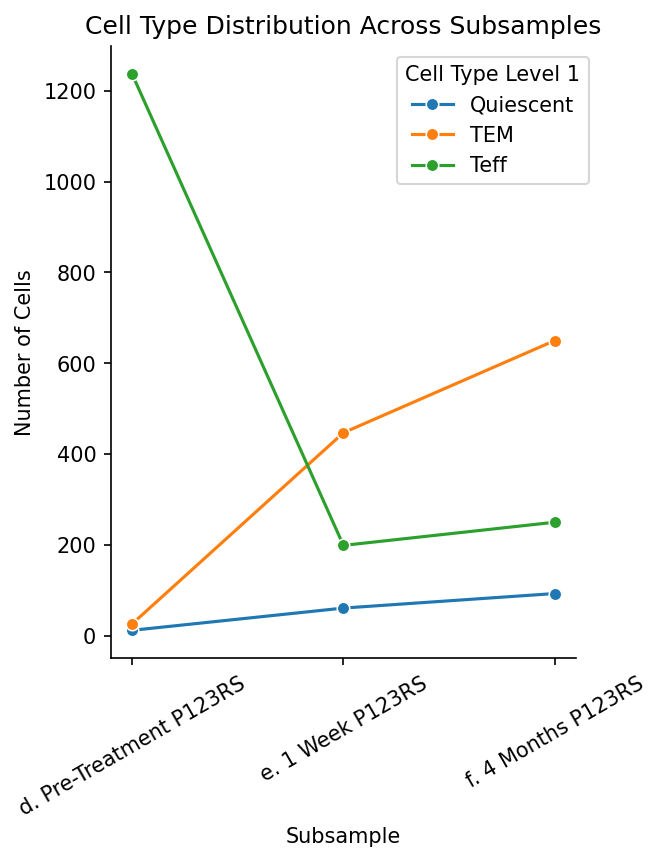

In [43]:
long_counts = counts.reset_index().melt(id_vars='cell_type_lvl1', var_name='subsample', value_name='n_cells')
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(4, 6), dpi=150)
ax = sns.lineplot(data=long_counts, x='subsample', y='n_cells', hue='cell_type_lvl1', marker='o', errorbar=None, ax=ax)

ax.set_xlabel("Subsample")
ax.set_ylabel("Number of Cells")
ax.tick_params(axis='x', rotation=30, labelsize=10)
ax.set_title("Cell Type Distribution Across Subsamples")
ax.legend(title="Cell Type Level 1", bbox_to_anchor=(1.05, 1), loc='best')


fig.subplots_adjust(bottom=0.2)
fig.savefig("/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P123_CD4/P123_CD4_celltype_distribution_across_subsamples.pdf", bbox_inches='tight')

Mean expression of EIF1:
  CD4 T: 1.892
Mean expression of STAT1:
  CD4 T: 0.706
Mean expression of CCR7:
  CD4 T: 0.189
Mean expression of IL7R:
  CD4 T: 1.111
Mean expression of TCF7:
  CD4 T: 0.605
Mean expression of JUN:
  CD4 T: 0.523
Mean expression of NFKBIA:
  CD4 T: 0.957
Mean expression of TNFAIP3:
  CD4 T: 0.807
Mean expression of ZFP36:
  CD4 T: 0.982
Mean expression of IFITM1:
  CD4 T: 1.656
Mean expression of CD74:
  CD4 T: 1.354
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_subsample']`


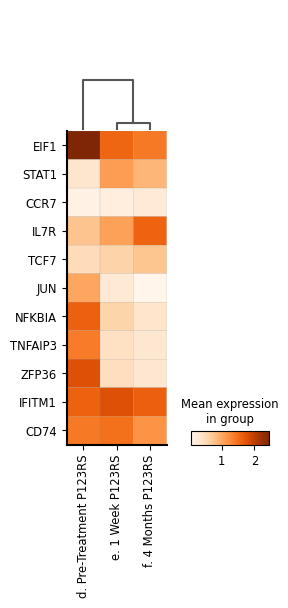

In [44]:
import pandas as pd
import scanpy as sc

genes = ['EIF1', 'STAT1', 'CCR7', 'IL7R', 'TCF7', 'JUN', 'NFKBIA', 'TNFAIP3', 'ZFP36', 'IFITM1','CD74']

# Calculate mean expression per gene per timepoint
mean_expr = {}
for gene in genes:
    means = []
    for tp in sorted(adata_p123.obs['predicted.celltype.l1'].unique()):
        cells_tp = adata_p123.obs.index[adata_p123.obs['predicted.celltype.l1'] == tp]
        expr_vals = adata_p123[cells_tp, gene].X
        if hasattr(expr_vals, "toarray"):
            expr_vals = expr_vals.toarray()
        mean_val = expr_vals.mean()
        means.append((tp, mean_val))
    mean_expr[gene] = means

# Print the mean expression per gene per timepoint
for gene, means in mean_expr.items():
    print(f"Mean expression of {gene}:")
    for tp, mean_val in means:
        print(f"  {tp}: {mean_val:.3f}")

# Now plot matrixplot as you wrote
sc.pl.matrixplot(
    adata_p123,
    var_names=genes,
    groupby="subsample",
    standard_scale="none",    # z-score genes for comparability
    cmap="Oranges",
    dendrogram=True,
    swap_axes=True,
    save="Markers_Celltype.pdf"
)


In [45]:
# Extract marker genes as metadata columns
if 'CD69' in adata_p123.var_names:
    idx = adata_p123.var_names.get_loc('CD69')
    if hasattr(adata_p123.X, 'toarray'):  # Sparse matrix
        adata_p123.obs['CD69'] = adata_p123.X[:, idx].toarray().flatten()
    else:  # Dense matrix
        adata_p123.obs['CD69'] = adata_p123.X[:, idx].flatten()
    print("✓ CD69 extracted")

if 'IL2RA' in adata_p123.var_names:
    idx = adata_p123.var_names.get_loc('IL2RA')
    if hasattr(adata_p123.X, 'toarray'):
        adata_p123.obs['IL2RA'] = adata_p123.X[:, idx].toarray().flatten()
    else:
        adata_p123.obs['IL2RA'] = adata_p123.X[:, idx].flatten()
    print("✓ IL2RA extracted")

# HLA-DR might be HLA-DRA, HLA-DRB1, etc.
hla_candidates = [name for name in adata_p123.var_names if 'HLA' in name and 'DR' in name]
if hla_candidates:
    hla_gene = hla_candidates[0]
    idx = adata_p123.var_names.get_loc(hla_gene)
    if hasattr(adata_p123.X, 'toarray'):
        adata_p123.obs['HLA_DR'] = adata_p123.X[:, idx].toarray().flatten()
    else:
        adata_p123.obs['HLA_DR'] = adata_p123.X[:, idx].flatten()
    print(f"✓ HLA-DR extracted (using {hla_gene})")


✓ CD69 extracted
✓ IL2RA extracted
✓ HLA-DR extracted (using HLA-DRA)


In [46]:
# Define gene signatures
stat1_isg = ['ISG15', 'ISG20', 'IFIT1', 'IFIT2', 'ISG6', 'MX1', 'OAS1', 'IRF7', 'IRF9', 'SP140', 'PARP9']
tcr_activation = ['IL2', 'IL2RA', 'TNF', 'NFKBIA', 'JUN', 'JUNB', 'FOS', 'EGR1', 'EGR2']
proliferation = ['PCNA', 'TOP2A', 'BIRC5', 'CDC20', 'MKI67']
ifn_independent = ['RRAGD', 'MTOR', 'RPS6KB1', 'EIF4EBP1']
il1_response = ['IL1R1', 'NFKB2', 'RELB', 'TNF', 'IL8']

# Score each cell
sc.tl.score_genes(adata_p123, stat1_isg, score_name='STAT1_ISG_score')
sc.tl.score_genes(adata_p123, tcr_activation, score_name='TCR_activation_score')
sc.tl.score_genes(adata_p123, proliferation, score_name='Proliferation_score')
sc.tl.score_genes(adata_p123, ifn_independent, score_name='IFN_indep_score')
sc.tl.score_genes(adata_p123, il1_response, score_name='IL1_response_score')


computing score 'STAT1_ISG_score'
    finished: added
    'STAT1_ISG_score', score of gene set (adata.obs).
    400 total control genes are used. (0:00:00)
computing score 'TCR_activation_score'
    finished: added
    'TCR_activation_score', score of gene set (adata.obs).
    299 total control genes are used. (0:00:00)
computing score 'Proliferation_score'
    finished: added
    'Proliferation_score', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)
computing score 'IFN_indep_score'
    finished: added
    'IFN_indep_score', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)
computing score 'IL1_response_score'
    finished: added
    'IL1_response_score', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)


CHECKING AVAILABLE COLUMNS IN .obs

Gene Scores (required for plots):
  ✓ STAT1_ISG_score
  ✓ TCR_activation_score
  ✓ Proliferation_score
  ✓ IL1_response_score

Marker Genes (used for coloring):
  ✓ CD69
  ✓ IL2RA
  ✓ HLA_DR

✓ All required scores present. Proceeding to plotting...

Plot 1: Colored by CD69 ✓
Plot 2: Colored by IL2RA ✓
Plot 3: CD69+ quadrant analysis (n=1487) ✓
Plot 4: Colored by HLA-DR ✓

✓ Plots saved as 'STAT1_activation_analysis.pdf'


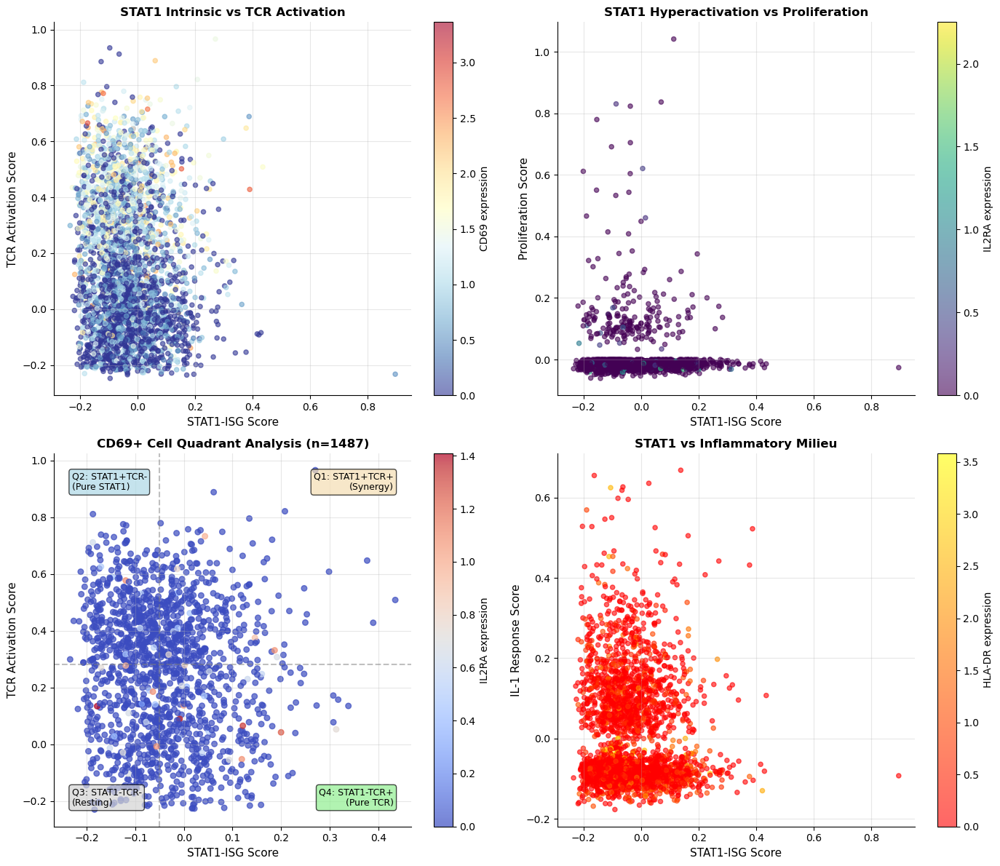


SUMMARY STATISTICS BY CELL POPULATION

CD69- IL2RA- (n=1437)
  STAT1-ISG score:     -0.029 ± 0.108
  TCR activation:      0.067 ± 0.215
  Proliferation:       0.001 ± 0.081
  IL1 response:        -0.019 ± 0.121

CD69+ IL2RA- (n=1436)
  STAT1-ISG score:     -0.038 ± 0.100
  TCR activation:      0.257 ± 0.240
  Proliferation:       -0.008 ± 0.037
  IL1 response:        0.028 ± 0.139

CD69+ IL2RA+ (n=51)
  STAT1-ISG score:     -0.019 ± 0.115
  TCR activation:      0.237 ± 0.217
  Proliferation:       0.014 ± 0.148
  IL1 response:        0.008 ± 0.148

ANALYSIS COMPLETE


In [47]:
# COMPLETE CORRECTED PLOTTING SCRIPT
# This version plots only using scores and extracted markers that actually exist

import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# ============================================================================
# DIAGNOSTIC: Check what columns are available
# ============================================================================

print("=" * 70)
print("CHECKING AVAILABLE COLUMNS IN .obs")
print("=" * 70)

required_scores = ['STAT1_ISG_score', 'TCR_activation_score', 'Proliferation_score', 'IL1_response_score']
marker_genes = ['CD69', 'IL2RA', 'HLA_DR']

print("\nGene Scores (required for plots):")
for score in required_scores:
    if score in adata_p123.obs.columns:
        print(f"  ✓ {score}")
    else:
        print(f"  ✗ {score} MISSING - run gene scoring first!")

print("\nMarker Genes (used for coloring):")
for marker in marker_genes:
    if marker in adata_p123.obs.columns:
        print(f"  ✓ {marker}")
    else:
        print(f"  ✗ {marker} not extracted yet")

# If any scores are missing, stop and tell user
missing_scores = [s for s in required_scores if s not in adata_p123.obs.columns]
if missing_scores:
    print(f"\n✗ ERROR: Missing scores: {missing_scores}")
    print("Please run the gene scoring step first!")
else:
    print(f"\n✓ All required scores present. Proceeding to plotting...")

# ============================================================================
# PLOTTING: Create figures using only available data
# ============================================================================

fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Determine what to use for coloring
color_cd69 = 'CD69' if 'CD69' in adata_p123.obs.columns else None
color_IL2RA = 'IL2RA' if 'IL2RA' in adata_p123.obs.columns else None
color_hladr = 'HLA_DR' if 'HLA_DR' in adata_p123.obs.columns else None

# ============================================================================
# Plot 1: STAT1_ISG vs TCR activation
# ============================================================================

ax = axes[0, 0]
if color_cd69:
    scatter = ax.scatter(adata_p123.obs['STAT1_ISG_score'], 
                         adata_p123.obs['TCR_activation_score'],
                         c=adata_p123.obs['CD69'],
                         cmap='RdYlBu_r', alpha=0.6, s=20)
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label('CD69 expression', fontsize=10)
    print("\nPlot 1: Colored by CD69 ✓")
else:
    ax.scatter(adata_p123.obs['STAT1_ISG_score'], 
               adata_p123.obs['TCR_activation_score'],
               alpha=0.6, s=20, color='steelblue')
    print("\nPlot 1: No color marker (using default) ⚠")

ax.set_xlabel('STAT1-ISG Score', fontsize=11)
ax.set_ylabel('TCR Activation Score', fontsize=11)
ax.set_title('STAT1 Intrinsic vs TCR Activation', fontsize=12, fontweight='bold')
ax.grid(True, alpha=0.3)

# ============================================================================
# Plot 2: STAT1_ISG vs Proliferation
# ============================================================================

ax = axes[0, 1]
if color_IL2RA:
    scatter = ax.scatter(adata_p123.obs['STAT1_ISG_score'], 
                         adata_p123.obs['Proliferation_score'],
                         c=adata_p123.obs['IL2RA'],
                         cmap='viridis', alpha=0.6, s=20)
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label('IL2RA expression', fontsize=10)
    print("Plot 2: Colored by IL2RA ✓")
else:
    ax.scatter(adata_p123.obs['STAT1_ISG_score'], 
               adata_p123.obs['Proliferation_score'],
               alpha=0.6, s=20, color='steelblue')
    print("Plot 2: No color marker (using default) ⚠")

ax.set_xlabel('STAT1-ISG Score', fontsize=11)
ax.set_ylabel('Proliferation Score', fontsize=11)
ax.set_title('STAT1 Hyperactivation vs Proliferation', fontsize=12, fontweight='bold')
ax.grid(True, alpha=0.3)

# ============================================================================
# Plot 3: CD69+ Cell Quadrant Analysis
# ============================================================================

ax = axes[1, 0]
if color_cd69:
    # Filter to CD69+ cells
    cd69_threshold = adata_p123.obs['CD69'].quantile(0.5)
    cd69_mask = adata_p123.obs['CD69'] > cd69_threshold
    cd69_cells = adata_p123[cd69_mask]
    
    if len(cd69_cells) > 0:
        if color_IL2RA:
            scatter = ax.scatter(cd69_cells.obs['STAT1_ISG_score'], 
                                cd69_cells.obs['TCR_activation_score'],
                                c=cd69_cells.obs['IL2RA'],
                                cmap='coolwarm', alpha=0.7, s=30)
            cbar = plt.colorbar(scatter, ax=ax)
            cbar.set_label('IL2RA expression', fontsize=10)
        else:
            ax.scatter(cd69_cells.obs['STAT1_ISG_score'], 
                      cd69_cells.obs['TCR_activation_score'],
                      alpha=0.7, s=30, color='coral')
        
        # Add quadrant lines
        stat1_median = cd69_cells.obs['STAT1_ISG_score'].median()
        tcr_median = cd69_cells.obs['TCR_activation_score'].median()
        ax.axhline(tcr_median, color='gray', linestyle='--', alpha=0.5, linewidth=1.5)
        ax.axvline(stat1_median, color='gray', linestyle='--', alpha=0.5, linewidth=1.5)
        
        # Label quadrants
        ax.text(0.95, 0.95, 'Q1: STAT1+TCR+\n(Synergy)', transform=ax.transAxes,
                ha='right', va='top', fontsize=9, bbox=dict(boxstyle='round', 
                facecolor='wheat', alpha=0.7))
        ax.text(0.05, 0.95, 'Q2: STAT1+TCR-\n(Pure STAT1)', transform=ax.transAxes,
                ha='left', va='top', fontsize=9, bbox=dict(boxstyle='round',
                facecolor='lightblue', alpha=0.7))
        ax.text(0.95, 0.05, 'Q4: STAT1-TCR+\n(Pure TCR)', transform=ax.transAxes,
                ha='right', va='bottom', fontsize=9, bbox=dict(boxstyle='round',
                facecolor='lightgreen', alpha=0.7))
        ax.text(0.05, 0.05, 'Q3: STAT1-TCR-\n(Resting)', transform=ax.transAxes,
                ha='left', va='bottom', fontsize=9, bbox=dict(boxstyle='round',
                facecolor='lightgray', alpha=0.7))
        
        ax.set_xlabel('STAT1-ISG Score', fontsize=11)
        ax.set_ylabel('TCR Activation Score', fontsize=11)
        ax.set_title(f'CD69+ Cell Quadrant Analysis (n={len(cd69_cells)})', 
                     fontsize=12, fontweight='bold')
        ax.grid(True, alpha=0.3)
        print(f"Plot 3: CD69+ quadrant analysis (n={len(cd69_cells)}) ✓")
    else:
        ax.text(0.5, 0.5, 'No CD69+ cells found', ha='center', va='center', transform=ax.transAxes)
        print("Plot 3: No CD69+ cells found ⚠")
else:
    ax.text(0.5, 0.5, 'CD69 marker not available', ha='center', va='center', transform=ax.transAxes)
    print("Plot 3: CD69 marker not available ⚠")

# ============================================================================
# Plot 4: STAT1 vs Inflammatory Milieu
# ============================================================================

ax = axes[1, 1]
if color_hladr:
    scatter = ax.scatter(adata_p123.obs['STAT1_ISG_score'], 
                         adata_p123.obs['IL1_response_score'],
                         c=adata_p123.obs['HLA_DR'],
                         cmap='autumn', alpha=0.6, s=20)
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label('HLA-DR expression', fontsize=10)
    print("Plot 4: Colored by HLA-DR ✓")
else:
    ax.scatter(adata_p123.obs['STAT1_ISG_score'], 
               adata_p123.obs['IL1_response_score'],
               alpha=0.6, s=20, color='orange')
    print("Plot 4: No color marker (using default) ⚠")

ax.set_xlabel('STAT1-ISG Score', fontsize=11)
ax.set_ylabel('IL-1 Response Score', fontsize=11)
ax.set_title('STAT1 vs Inflammatory Milieu', fontsize=12, fontweight='bold')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('./P123_CD4/STAT1_activation_analysis.pdf', dpi=300, bbox_inches='tight')
print("\n✓ Plots saved as 'STAT1_activation_analysis.pdf'")
plt.show()

# ============================================================================
# Summary Statistics
# ============================================================================

print("\n" + "=" * 70)
print("SUMMARY STATISTICS BY CELL POPULATION")
print("=" * 70)

if color_cd69 and color_IL2RA:
    cd69_median = adata_p123.obs['CD69'].median()
    IL2RA_median = adata_p123.obs['IL2RA'].median()
    
    pop_cd69_neg_IL2RA_neg = adata_p123[(adata_p123.obs['CD69'] <= cd69_median) & 
                                        (adata_p123.obs['IL2RA'] <= IL2RA_median)]
    pop_cd69_pos_IL2RA_neg = adata_p123[(adata_p123.obs['CD69'] > cd69_median) & 
                                        (adata_p123.obs['IL2RA'] <= IL2RA_median)]
    pop_cd69_pos_IL2RA_pos = adata_p123[(adata_p123.obs['CD69'] > cd69_median) & 
                                        (adata_p123.obs['IL2RA'] > IL2RA_median)]
    
    populations = {
        'CD69- IL2RA-': pop_cd69_neg_IL2RA_neg,
        'CD69+ IL2RA-': pop_cd69_pos_IL2RA_neg,
        'CD69+ IL2RA+': pop_cd69_pos_IL2RA_pos
    }
    
    for pop_name, pop_data in populations.items():
        print(f"\n{pop_name} (n={len(pop_data)})")
        print(f"  STAT1-ISG score:     {pop_data.obs['STAT1_ISG_score'].mean():.3f} ± {pop_data.obs['STAT1_ISG_score'].std():.3f}")
        print(f"  TCR activation:      {pop_data.obs['TCR_activation_score'].mean():.3f} ± {pop_data.obs['TCR_activation_score'].std():.3f}")
        print(f"  Proliferation:       {pop_data.obs['Proliferation_score'].mean():.3f} ± {pop_data.obs['Proliferation_score'].std():.3f}")
        print(f"  IL1 response:        {pop_data.obs['IL1_response_score'].mean():.3f} ± {pop_data.obs['IL1_response_score'].std():.3f}")

elif color_cd69:
    cd69_median = adata_p123.obs['CD69'].median()
    pop_cd69_neg = adata_p123[adata_p123.obs['CD69'] <= cd69_median]
    pop_cd69_pos = adata_p123[adata_p123.obs['CD69'] > cd69_median]
    
    populations = {
        'CD69-': pop_cd69_neg,
        'CD69+': pop_cd69_pos
    }
    
    for pop_name, pop_data in populations.items():
        print(f"\n{pop_name} (n={len(pop_data)})")
        print(f"  STAT1-ISG score:     {pop_data.obs['STAT1_ISG_score'].mean():.3f} ± {pop_data.obs['STAT1_ISG_score'].std():.3f}")
        print(f"  TCR activation:      {pop_data.obs['TCR_activation_score'].mean():.3f} ± {pop_data.obs['TCR_activation_score'].std():.3f}")
        print(f"  Proliferation:       {pop_data.obs['Proliferation_score'].mean():.3f} ± {pop_data.obs['Proliferation_score'].std():.3f}")
        print(f"  IL1 response:        {pop_data.obs['IL1_response_score'].mean():.3f} ± {pop_data.obs['IL1_response_score'].std():.3f}")
else:
    print("\nCD69 marker not available for population-specific analysis")
    print("\nGlobal statistics:")
    print(f"  STAT1-ISG score (all cells):     {adata_p123.obs['STAT1_ISG_score'].mean():.3f} ± {adata_p123.obs['STAT1_ISG_score'].std():.3f}")
    print(f"  TCR activation (all cells):      {adata_p123.obs['TCR_activation_score'].mean():.3f} ± {adata_p123.obs['TCR_activation_score'].std():.3f}")
    print(f"  Proliferation (all cells):       {adata_p123.obs['Proliferation_score'].mean():.3f} ± {adata_p123.obs['Proliferation_score'].std():.3f}")
    print(f"  IL1 response (all cells):        {adata_p123.obs['IL1_response_score'].mean():.3f} ± {adata_p123.obs['IL1_response_score'].std():.3f}")

print("\n" + "=" * 70)
print("ANALYSIS COMPLETE")
print("=" * 70)


COMPREHENSIVE STAT1-GOF ANALYSIS - COLORED BY SUBSAMPLE

Dataset: 2975 cells

✓ Found 'subsample' column
  Subsamples: [np.str_('d. Pre-Treatment P123RS'), np.str_('e. 1 Week P123RS'), np.str_('f. 4 Months P123RS')]

SCORING SIGNATURES
  ✓ STAT1_ISG: Already scored
  ✓ TCR_activation: Already scored
  ✓ Proliferation: Already scored
computing score 'IFN_independent_score'
    finished: added
    'IFN_independent_score', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)
  ✓ IFN_independent: 4/4 genes
  ✓ IL1_response: Already scored

CREATING MAIN COMPARISON PLOTS (2x2)

✓ Main plots saved as 'STAT1_comprehensive_analysis.png'


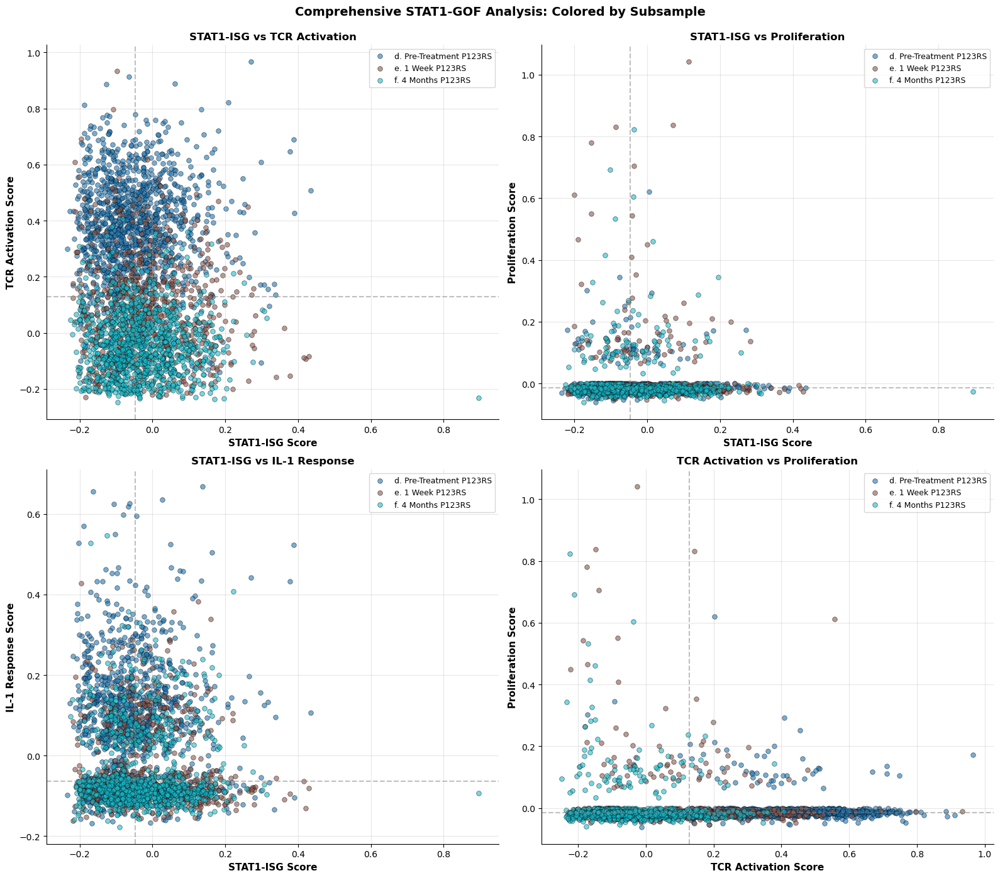


CREATING DETAILED INDIVIDUAL PLOTS
  ✓ ./P123_CD4/STAT1_STAT1_vs_TCR.png
  ✓ ./P123_CD4/STAT1_STAT1_vs_Proliferation.png
  ✓ ./P123_CD4/STAT1_STAT1_vs_IL1.png
  ✓ ./P123_CD4/STAT1_TCR_vs_Proliferation.png
  ✓ ./P123_CD4/STAT1_TCR_vs_IL1.png
  ✓ ./P123_CD4/STAT1_Proliferation_vs_IL1.png

SUMMARY STATISTICS BY SUBSAMPLE

              Subsample  N_cells  STAT1_ISG_mean  STAT1_ISG_std  TCR_activation_mean  TCR_activation_std  Proliferation_mean  Proliferation_std  IL1_response_mean  IL1_response_std  IFN_independent_mean
d. Pre-Treatment P123RS     1275       -0.048905       0.099989             0.368789            0.185957           -0.007696           0.037529           0.062744          0.150806              0.007886
       e. 1 Week P123RS      707       -0.009241       0.113191             0.077178            0.173303            0.005639           0.098123          -0.036104          0.097995             -0.006506
     f. 4 Months P123RS      993       -0.029154       0.100254      

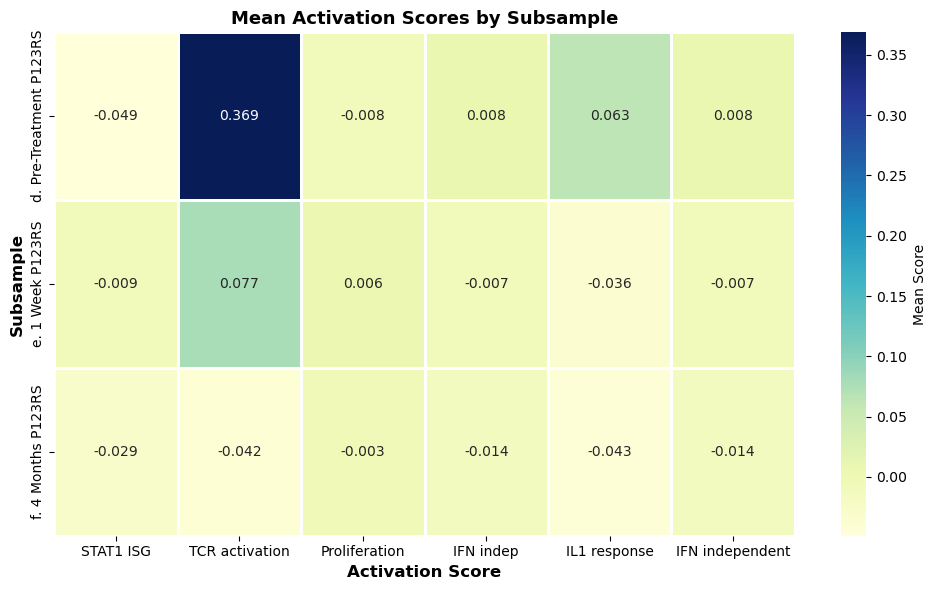


ANALYSIS COMPLETE

Files generated:
  - STAT1_comprehensive_analysis.png (2x2 main plot)
  - STAT1_[comparison1]_vs_[comparison2].png (6 individual plots)
  - STAT1_scores_heatmap.png (score comparison heatmap)
  - STAT1_summary_statistics.csv (detailed statistics)

KEY COMPARISONS:
  1. STAT1-ISG vs TCR Activation: Distinguishes intrinsic (low TCR) vs synergistic (high TCR)
  2. STAT1-ISG vs Proliferation: Shows if STAT1 drives proliferation
  3. STAT1-ISG vs IL-1 Response: Shows if STAT1 overlaps with inflammatory milieu
  4. TCR vs Proliferation: Shows if TCR-driven cells are proliferating
  5. TCR vs IL-1 Response: Shows if TCR overlaps with bystander activation
  6. Proliferation vs IL-1: Shows if inflammatory milieu drives proliferation

Use the heatmap to compare overall activation patterns across subsamples.



In [48]:
# MULTIPLE PLOTS COLORED BY SUBSAMPLE
# All score combinations: STAT1 vs TCR, STAT1 vs Proliferation, STAT1 vs IL1, etc.

import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# ============================================================================
# STEP 1: Load and prepare your data
# ============================================================================

# Replace with your actual object name
adata = adata_p123  # YOUR OBJECT HERE

print("=" * 70)
print("COMPREHENSIVE STAT1-GOF ANALYSIS - COLORED BY SUBSAMPLE")
print("=" * 70)

print(f"\nDataset: {adata.n_obs} cells")

# Check for subsample column
if 'subsample' not in adata.obs.columns:
    print("\n✗ ERROR: 'subsample' column not found")
    print("Available columns:", adata.obs.columns.tolist())
else:
    print(f"\n✓ Found 'subsample' column")
    subsamples = adata.obs['subsample'].unique()
    print(f"  Subsamples: {subsamples.tolist()}")

# ============================================================================
# STEP 2: Define and score all signatures
# ============================================================================

stat1_isg = ['ISG15', 'ISG20', 'IFIT1', 'IFIT2', 'ISG6', 'MX1', 'OAS1', 
             'IRF7', 'IRF9', 'SP140', 'PARP9']
tcr_activation = ['IL2', 'IL2RA', 'TNF', 'NFKBIA', 'JUN', 'JUNB', 'FOS', 
                  'EGR1', 'EGR2']
proliferation = ['PCNA', 'TOP2A', 'BIRC5', 'CDC20', 'MKI67']
ifn_independent = ['RRAGD', 'MTOR', 'RPS6KB1', 'EIF4EBP1']
il1_response = ['IL1R1', 'NFKB2', 'RELB', 'TNF', 'IL8']

def validate_and_filter_genes(adata, gene_list):
    return [g for g in gene_list if g in adata.var_names]

# Score all signatures
print("\n" + "=" * 70)
print("SCORING SIGNATURES")
print("=" * 70)

signatures = {
    'STAT1_ISG': stat1_isg,
    'TCR_activation': tcr_activation,
    'Proliferation': proliferation,
    'IFN_independent': ifn_independent,
    'IL1_response': il1_response
}

for sig_name, gene_list in signatures.items():
    score_name = f'{sig_name}_score'
    if score_name not in adata.obs.columns:
        valid_genes = validate_and_filter_genes(adata, gene_list)
        if len(valid_genes) > 0:
            sc.tl.score_genes(adata, valid_genes, score_name=score_name)
            print(f"  ✓ {sig_name}: {len(valid_genes)}/{len(gene_list)} genes")
        else:
            print(f"  ✗ {sig_name}: NO VALID GENES")
    else:
        print(f"  ✓ {sig_name}: Already scored")

# ============================================================================
# STEP 3: Create main 2x2 comparison plots
# ============================================================================

print("\n" + "=" * 70)
print("CREATING MAIN COMPARISON PLOTS (2x2)")
print("=" * 70)

fig, axes = plt.subplots(2, 2, figsize=(16, 14))

# Get subsamples and colors
subsamples = sorted(adata.obs['subsample'].unique())
colors = plt.cm.tab10(np.linspace(0, 1, len(subsamples)))
color_dict = {sub: color for sub, color in zip(subsamples, colors)}

# Plot 1: STAT1_ISG vs TCR_activation
ax = axes[0, 0]
for subsample in subsamples:
    adata_sub = adata[adata.obs['subsample'] == subsample]
    ax.scatter(adata_sub.obs['STAT1_ISG_score'],
               adata_sub.obs['TCR_activation_score'],
               label=subsample, color=color_dict[subsample],
               alpha=0.6, s=30, edgecolors='black', linewidth=0.5)

stat1_med = adata.obs['STAT1_ISG_score'].median()
tcr_med = adata.obs['TCR_activation_score'].median()
ax.axhline(tcr_med, color='gray', linestyle='--', alpha=0.5, linewidth=1.5)
ax.axvline(stat1_med, color='gray', linestyle='--', alpha=0.5, linewidth=1.5)

ax.set_xlabel('STAT1-ISG Score', fontsize=11, fontweight='bold')
ax.set_ylabel('TCR Activation Score', fontsize=11, fontweight='bold')
ax.set_title('STAT1-ISG vs TCR Activation', fontsize=12, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(fontsize=9, loc='best')

# Plot 2: STAT1_ISG vs Proliferation
ax = axes[0, 1]
for subsample in subsamples:
    adata_sub = adata[adata.obs['subsample'] == subsample]
    ax.scatter(adata_sub.obs['STAT1_ISG_score'],
               adata_sub.obs['Proliferation_score'],
               label=subsample, color=color_dict[subsample],
               alpha=0.6, s=30, edgecolors='black', linewidth=0.5)

stat1_med = adata.obs['STAT1_ISG_score'].median()
prolif_med = adata.obs['Proliferation_score'].median()
ax.axhline(prolif_med, color='gray', linestyle='--', alpha=0.5, linewidth=1.5)
ax.axvline(stat1_med, color='gray', linestyle='--', alpha=0.5, linewidth=1.5)

ax.set_xlabel('STAT1-ISG Score', fontsize=11, fontweight='bold')
ax.set_ylabel('Proliferation Score', fontsize=11, fontweight='bold')
ax.set_title('STAT1-ISG vs Proliferation', fontsize=12, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(fontsize=9, loc='best')

# Plot 3: STAT1_ISG vs IL1_response
ax = axes[1, 0]
for subsample in subsamples:
    adata_sub = adata[adata.obs['subsample'] == subsample]
    ax.scatter(adata_sub.obs['STAT1_ISG_score'],
               adata_sub.obs['IL1_response_score'],
               label=subsample, color=color_dict[subsample],
               alpha=0.6, s=30, edgecolors='black', linewidth=0.5)

stat1_med = adata.obs['STAT1_ISG_score'].median()
il1_med = adata.obs['IL1_response_score'].median()
ax.axhline(il1_med, color='gray', linestyle='--', alpha=0.5, linewidth=1.5)
ax.axvline(stat1_med, color='gray', linestyle='--', alpha=0.5, linewidth=1.5)

ax.set_xlabel('STAT1-ISG Score', fontsize=11, fontweight='bold')
ax.set_ylabel('IL-1 Response Score', fontsize=11, fontweight='bold')
ax.set_title('STAT1-ISG vs IL-1 Response', fontsize=12, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(fontsize=9, loc='best')

# Plot 4: TCR_activation vs Proliferation
ax = axes[1, 1]
for subsample in subsamples:
    adata_sub = adata[adata.obs['subsample'] == subsample]
    ax.scatter(adata_sub.obs['TCR_activation_score'],
               adata_sub.obs['Proliferation_score'],
               label=subsample, color=color_dict[subsample],
               alpha=0.6, s=30, edgecolors='black', linewidth=0.5)

tcr_med = adata.obs['TCR_activation_score'].median()
prolif_med = adata.obs['Proliferation_score'].median()
ax.axhline(prolif_med, color='gray', linestyle='--', alpha=0.5, linewidth=1.5)
ax.axvline(tcr_med, color='gray', linestyle='--', alpha=0.5, linewidth=1.5)

ax.set_xlabel('TCR Activation Score', fontsize=11, fontweight='bold')
ax.set_ylabel('Proliferation Score', fontsize=11, fontweight='bold')
ax.set_title('TCR Activation vs Proliferation', fontsize=12, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(fontsize=9, loc='best')

plt.suptitle('Comprehensive STAT1-GOF Analysis: Colored by Subsample', 
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig('./P123_CD4/STAT1_comprehensive_analysis.pdf', dpi=300, bbox_inches='tight')
print("\n✓ Main plots saved as 'STAT1_comprehensive_analysis.png'")
plt.show()

# ============================================================================
# STEP 4: Individual detailed plots (one per comparison)
# ============================================================================

print("\n" + "=" * 70)
print("CREATING DETAILED INDIVIDUAL PLOTS")
print("=" * 70)

plot_combinations = [
    ('STAT1_ISG_score', 'TCR_activation_score', 'STAT1-ISG vs TCR Activation'),
    ('STAT1_ISG_score', 'Proliferation_score', 'STAT1-ISG vs Proliferation'),
    ('STAT1_ISG_score', 'IL1_response_score', 'STAT1-ISG vs IL-1 Response'),
    ('TCR_activation_score', 'Proliferation_score', 'TCR Activation vs Proliferation'),
    ('TCR_activation_score', 'IL1_response_score', 'TCR Activation vs IL-1 Response'),
    ('Proliferation_score', 'IL1_response_score', 'Proliferation vs IL-1 Response'),
]

for x_score, y_score, title in plot_combinations:
    fig, ax = plt.subplots(figsize=(10, 8))
    
    for subsample in subsamples:
        adata_sub = adata[adata.obs['subsample'] == subsample]
        ax.scatter(adata_sub.obs[x_score],
                   adata_sub.obs[y_score],
                   label=subsample, color=color_dict[subsample],
                   alpha=0.6, s=40, edgecolors='black', linewidth=0.5)
    
    # Add median lines
    x_med = adata.obs[x_score].median()
    y_med = adata.obs[y_score].median()
    ax.axhline(y_med, color='gray', linestyle='--', alpha=0.5, linewidth=2)
    ax.axvline(x_med, color='gray', linestyle='--', alpha=0.5, linewidth=2)
    
    ax.set_xlabel(x_score.replace('_score', '').replace('_', ' '), 
                  fontsize=12, fontweight='bold')
    ax.set_ylabel(y_score.replace('_score', '').replace('_', ' '), 
                  fontsize=12, fontweight='bold')
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=10, loc='best', title='Subsample', title_fontsize=11)
    
    plt.tight_layout()
    filename = f"STAT1_{x_score.split('_')[0]}_vs_{y_score.split('_')[0]}.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"  ✓ ./P123_CD4/{filename}")
    plt.close()

# ============================================================================
# STEP 5: Summary statistics table
# ============================================================================

print("\n" + "=" * 70)
print("SUMMARY STATISTICS BY SUBSAMPLE")
print("=" * 70)

summary_stats = []

for subsample in subsamples:
    adata_sub = adata[adata.obs['subsample'] == subsample]
    
    row = {
        'Subsample': subsample,
        'N_cells': len(adata_sub),
        'STAT1_ISG_mean': adata_sub.obs['STAT1_ISG_score'].mean(),
        'STAT1_ISG_std': adata_sub.obs['STAT1_ISG_score'].std(),
        'TCR_activation_mean': adata_sub.obs['TCR_activation_score'].mean(),
        'TCR_activation_std': adata_sub.obs['TCR_activation_score'].std(),
        'Proliferation_mean': adata_sub.obs['Proliferation_score'].mean(),
        'Proliferation_std': adata_sub.obs['Proliferation_score'].std(),
        'IL1_response_mean': adata_sub.obs['IL1_response_score'].mean(),
        'IL1_response_std': adata_sub.obs['IL1_response_score'].std(),
    }
    
    if 'IFN_independent_score' in adata.obs.columns:
        row['IFN_independent_mean'] = adata_sub.obs['IFN_independent_score'].mean()
    
    summary_stats.append(row)

summary_df = pd.DataFrame(summary_stats)
print("\n" + summary_df.to_string(index=False))

# Save to CSV
summary_df.to_csv('STAT1_summary_statistics.csv', index=False)
print("\n✓ Summary statistics saved as 'STAT1_summary_statistics.csv'")

# ============================================================================
# STEP 6: Heatmap of scores by subsample
# ============================================================================

print("\n" + "=" * 70)
print("CREATING HEATMAP")
print("=" * 70)

# Calculate mean scores per subsample
score_cols = [col for col in adata.obs.columns if '_score' in col]
heatmap_data = []

for subsample in subsamples:
    adata_sub = adata[adata.obs['subsample'] == subsample]
    row = {score: adata_sub.obs[score].mean() for score in score_cols}
    heatmap_data.append(row)

heatmap_df = pd.DataFrame(heatmap_data, index=subsamples)
heatmap_df.columns = [col.replace('_score', '').replace('_', ' ') for col in heatmap_df.columns]

fig, ax = plt.subplots(figsize=(10, 6))
sns.heatmap(heatmap_df, annot=True, fmt='.3f', cmap='YlGnBu', 
            cbar_kws={'label': 'Mean Score'}, ax=ax, linewidths=1)
ax.set_title('Mean Activation Scores by Subsample', fontsize=13, fontweight='bold')
ax.set_ylabel('Subsample', fontsize=12, fontweight='bold')
ax.set_xlabel('Activation Score', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('./P123_CD4/STAT1_scores_heatmap.pdf', dpi=300, bbox_inches='tight')
print("\n✓ Heatmap saved as 'STAT1_scores_heatmap.pdf'")
plt.show()

# ============================================================================
# STEP 7: Summary
# ============================================================================

print("\n" + "=" * 70)
print("ANALYSIS COMPLETE")
print("=" * 70)

print("""
Files generated:
  - STAT1_comprehensive_analysis.png (2x2 main plot)
  - STAT1_[comparison1]_vs_[comparison2].png (6 individual plots)
  - STAT1_scores_heatmap.png (score comparison heatmap)
  - STAT1_summary_statistics.csv (detailed statistics)

KEY COMPARISONS:
  1. STAT1-ISG vs TCR Activation: Distinguishes intrinsic (low TCR) vs synergistic (high TCR)
  2. STAT1-ISG vs Proliferation: Shows if STAT1 drives proliferation
  3. STAT1-ISG vs IL-1 Response: Shows if STAT1 overlaps with inflammatory milieu
  4. TCR vs Proliferation: Shows if TCR-driven cells are proliferating
  5. TCR vs IL-1 Response: Shows if TCR overlaps with bystander activation
  6. Proliferation vs IL-1: Shows if inflammatory milieu drives proliferation

Use the heatmap to compare overall activation patterns across subsamples.
""")


COMPREHENSIVE STAT1-GOF ANALYSIS - ALL SIGNATURES

Dataset: 2975 cells

✓ Found 'subsample' column
  Subsamples: [np.str_('d. Pre-Treatment P123RS'), np.str_('e. 1 Week P123RS'), np.str_('f. 4 Months P123RS')]

DEFINING GENE SIGNATURES

Total signatures defined: 14
  - STAT1_ISG
  - TCR_activation
  - Proliferation
  - IL1_response
  - Exhaustion
  - Senescence
  - Th17
  - Th1
  - Glycolysis
  - Lipid_oxidation
  - Central_memory
  - Effector_memory
  - STAT_inhibitors
  - DNA_damage

SCORING GENE SIGNATURES
  ✓ STAT1_ISG: Already scored
  ✓ TCR_activation: Already scored
  ✓ Proliferation: Already scored
  ✓ IL1_response: Already scored
computing score 'Exhaustion_score'
    finished: added
    'Exhaustion_score', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)
  ✓ Exhaustion: 5/5 genes
computing score 'Senescence_score'
    finished: added
    'Senescence_score', score of gene set (adata.obs).
    249 total control genes are used. (0:00:00)
  ✓ Senesce

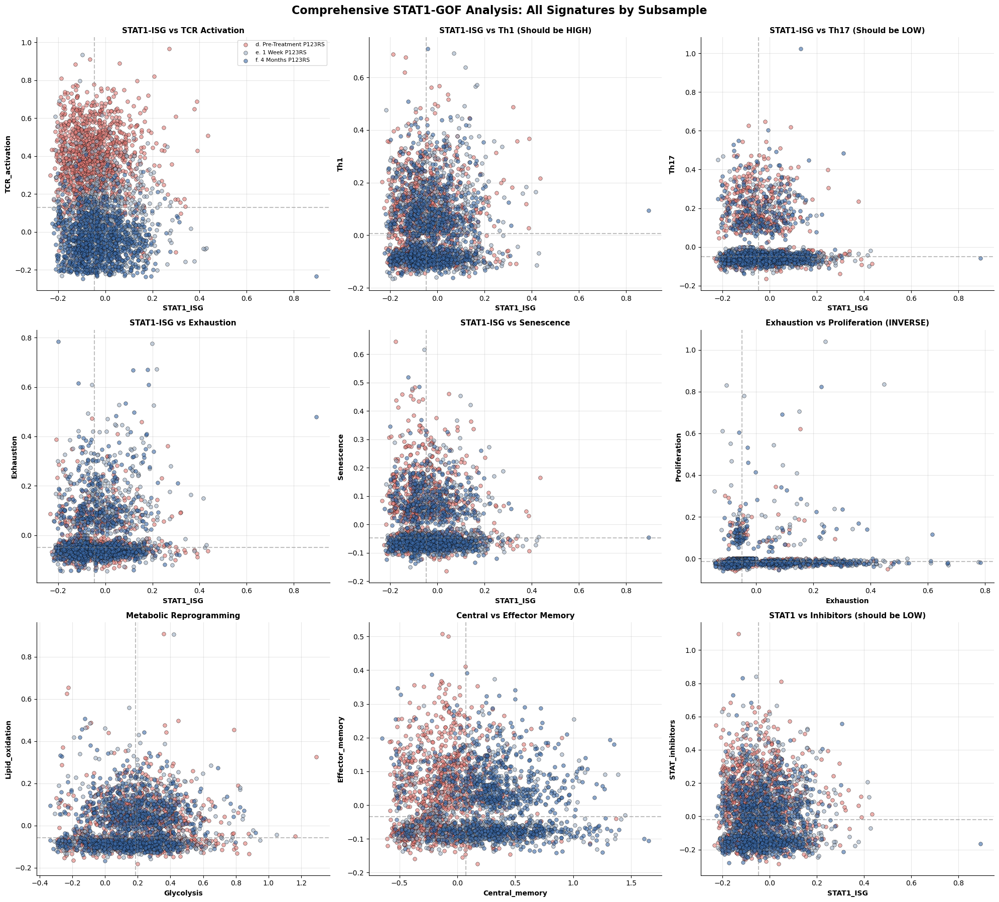


CALCULATING STAT1-ISG/TCR QUADRANT COMPOSITION BY SUBSAMPLE

              Subsample  Q1_count  Q1_percent  Q2_count  Q2_percent  Q3_count  Q3_percent  Q4_count  Q4_percent
d. Pre-Treatment P123RS       511   40.078431        39    3.058824        75    5.882353       650   50.980392
       e. 1 Week P123RS       143   20.226308       267   37.765205       192   27.157001       105   14.851485
     f. 4 Months P123RS        40    4.028197       487   49.043303       428   43.101712        38    3.826788

✓ Quadrant composition saved to 'STAT1_quadrant_composition.csv'

CREATING STAT1/TCR QUADRANT COMPOSITION BAR PLOT

✓ STAT1/TCR quadrant bar plot saved as 'STAT1_quadrant_composition_barplot.pdf'


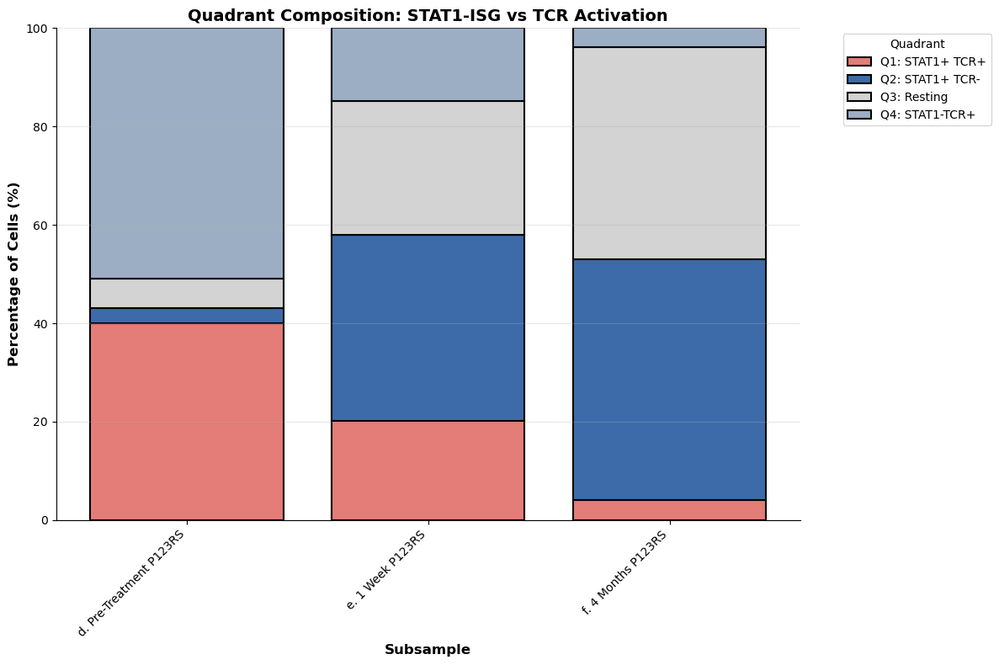


CALCULATING MEMORY QUADRANT COMPOSITION BY SUBSAMPLE

              Subsample  Q1_count  Q1_percent  Q2_count  Q2_percent  Q3_count  Q3_percent  Q4_count  Q4_percent
d. Pre-Treatment P123RS       152   11.921569       135   10.588235       470   36.862745       518   40.627451
       e. 1 Week P123RS       161   22.772277       279   39.462518       177   25.035361        90   12.729844
     f. 4 Months P123RS       440   44.310171       320   32.225579       107   10.775428       126   12.688822

✓ Memory quadrant composition saved to 'STAT1_memory_quadrant_composition.csv'

CREATING MEMORY QUADRANT COMPOSITION BAR PLOT

✓ Memory quadrant bar plot saved as 'STAT1_memory_quadrant_composition_barplot.pdf'


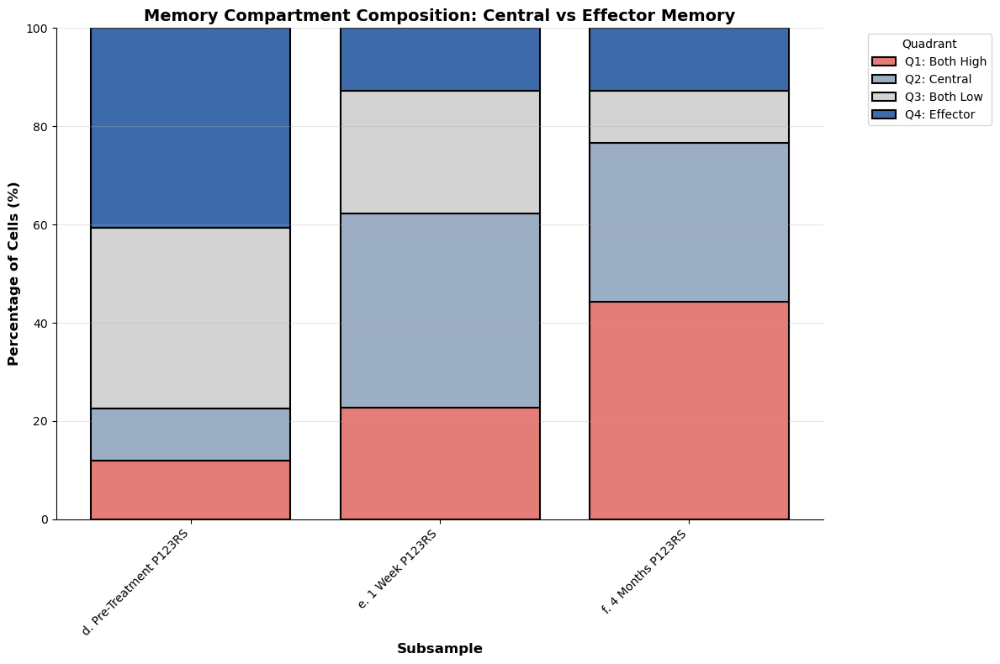


CREATING TIER 1 ESSENTIAL PLOTS (2x2)

✓ Tier 1 essential plots saved as 'STAT1_tier1_essential.pdf'


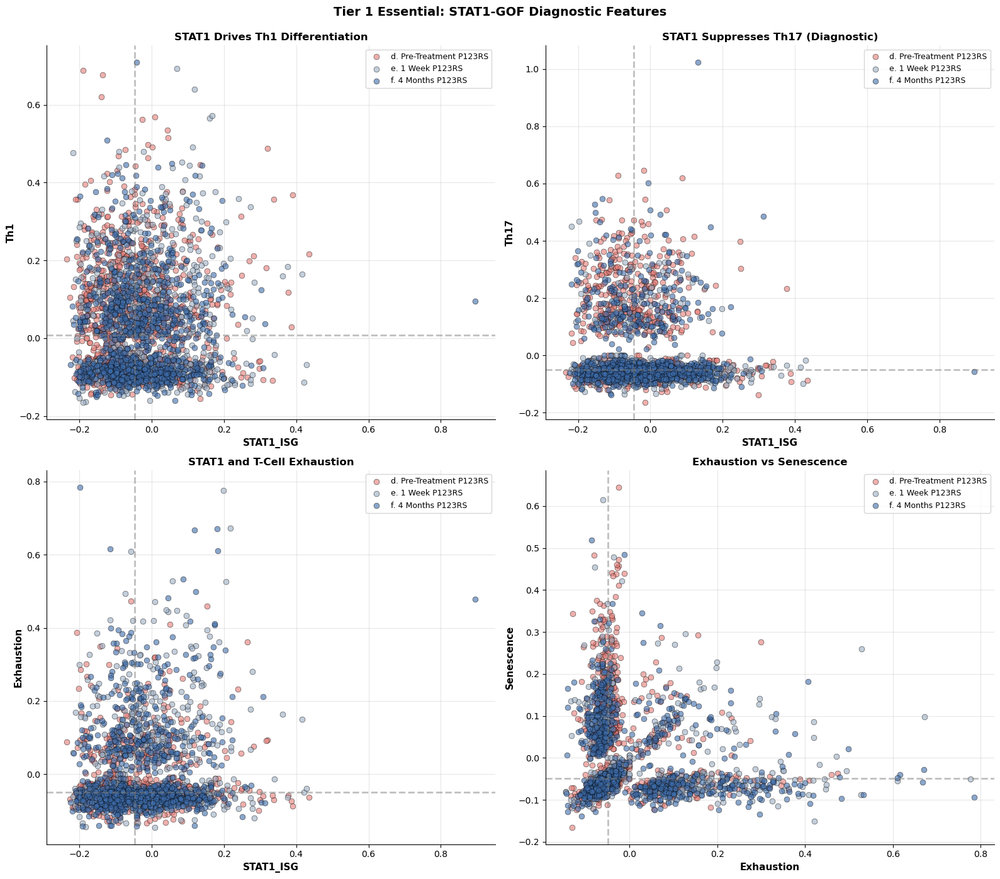


CREATING COMPREHENSIVE HEATMAP

✓ Heatmap saved as 'STAT1_all_signatures_heatmap.pdf'


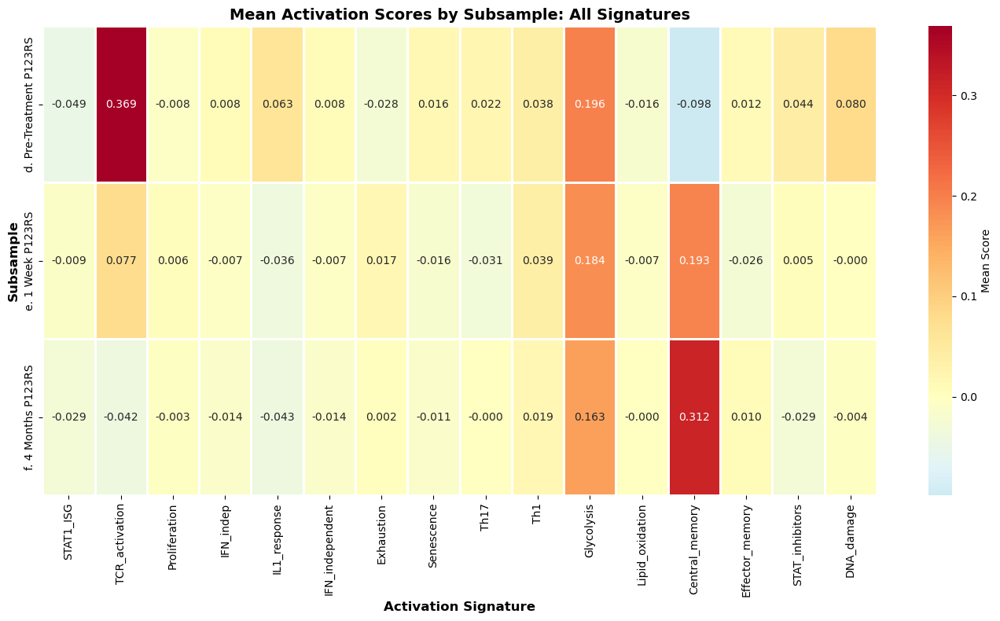


COMPREHENSIVE STATISTICS BY SUBSAMPLE

              Subsample  N_cells  STAT1_ISG_mean  STAT1_ISG_std  TCR_activation_mean  TCR_activation_std  Proliferation_mean  Proliferation_std  IL1_response_mean  IL1_response_std  Exhaustion_mean  Exhaustion_std  Senescence_mean  Senescence_std  Th17_mean  Th17_std  Th1_mean  Th1_std  Glycolysis_mean  Glycolysis_std  Lipid_oxidation_mean  Lipid_oxidation_std  Central_memory_mean  Central_memory_std  Effector_memory_mean  Effector_memory_std  STAT_inhibitors_mean  STAT_inhibitors_std  DNA_damage_mean  DNA_damage_std
d. Pre-Treatment P123RS     1275       -0.048905       0.099989             0.368789            0.185957           -0.007696           0.037529           0.062744          0.150806        -0.028296        0.072178         0.015780        0.109213   0.021506  0.138399  0.038133 0.134854         0.195812        0.212760             -0.016256             0.106384            -0.097968            0.261737              0.012346            

In [49]:
# COMPREHENSIVE STAT1-GOF ANALYSIS WITH ALL SIGNATURES
# Includes: Basic activation + Exhaustion + Senescence + Th17/Th1 + Metabolism + Trafficking
# WITH CUSTOM COLORS FOR P116RS TIME POINTS
# WITH QUADRANT COMPOSITION ANALYSIS FOR STAT1-ISG/TCR AND MEMORY COMPARTMENTS

import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# ============================================================================
# STEP 1: Load and prepare your data
# ============================================================================

# Replace with your actual object name
adata = adata_p123  # YOUR OBJECT HERE

print("=" * 70)
print("COMPREHENSIVE STAT1-GOF ANALYSIS - ALL SIGNATURES")
print("=" * 70)

print(f"\nDataset: {adata.n_obs} cells")

# Check for subsample column
if 'subsample' not in adata.obs.columns:
    print("\n✗ ERROR: 'subsample' column not found")
    print("Available columns:", adata.obs.columns.tolist())
else:
    print(f"\n✓ Found 'subsample' column")
    subsamples = adata.obs['subsample'].unique()
    print(f"  Subsamples: {subsamples.tolist()}")

# ============================================================================
# STEP 2: Define ALL gene signatures
# ============================================================================

print("\n" + "=" * 70)
print("DEFINING GENE SIGNATURES")
print("=" * 70)

# Basic activation signatures
stat1_isg = ['ISG15', 'ISG20', 'IFIT1', 'IFIT2', 'ISG6', 'MX1', 'OAS1', 
             'IRF7', 'IRF9', 'SP140', 'PARP9']
tcr_activation = ["ACADM", "PXYLP1", "ACSL3", "ADAT2", "GRK3", "AGPAT5", "AHCYL2", "AIF1", "AP2B1", "APOLD1","ARHGEF2", "ARHGEF6", "ARHGEF7", "ASCC1", "ATP8A1", "ATP8B3", "B3GNT5", "B3GNTL1", "BATF3","BEND5", "BABAM2", "BSPRY", "ABTB3", "BTBD3", "RUBCNL", "LINC01588", "ELP5", "FAM210A","C2orf76", "NOA1", "NREP", "CACNA2D4", "CASP9", "KYAT3", "CCDC51", "CCKAR", "CCR7", "CD2","CD200", "CD27", "CD38", "CDK5", "CENPV", "CHMP5", "CHRNA6", "CHSY1", "CLDN12", "CLTC","CNIH1", "COL6A3", "COX10", "COX15", "CPPED1", "CPSF6", "CREB3L4", "CTTN", "CXCL13", "DBN1","INTS6L", "DECR1", "DENR", "DHCR24", "DHTKD1", "DIXDC1", "DLEU1", "DNAH14", "DUS2", "DYNLL1","EFL1", "EGR1", "ETS2", "ETV6", "FASLG", "FASN", "FDX1", "FGGY", "GEM", "GFI1", "GK", "GNA12","GRAMD4", "GRK4", "GSTO2", "GZMH", "HDC", "HIBADH", "HMG20A", "HSD17B6", "IFT27", "IFT74","ILDR2", "BPNT2", "ITCH", "ITGAE", "KCNK5", "LANCL2", "LASP1", "LAT2", "GFOD1", "LINC01281","LRRCC1", "MAPRE2", "MCCC2", "MCTP2", "METTL13", "MGST2", "MOB1B", "MPP1", "MPZL1", "MRPS15","MRPS6", "STK26", "MYB", "MYEF2", "MYO7B", "NAB1", "NBAS", "NDFIP2", "NFATC3", "SLC9B2","NHS", "NME7", "NR5A2", "NRAS", "NT5C2", "NTRK1", "OSBP2", "PALLD", "TENT4B", "PAQR6","PDE7B", "PDGFA", "PI4K2A", "STMP1", "PMS1", "PPA1", "PPP2R5A", "PRF1", "PRPF6", "PTDSS1","PTGFRN", "PTPN14", "PTPN3", "QSOX2", "RAB27A", "RAB33A", "MOK", "RCL1", "RGL4", "RGS3","RHOBTB3", "RNASEH2B", "RPAP2", "RPRD2", "SEC11A", "SEC31B", "SELL", "SERPINB1", "SIAH2","SIRPG", "SLC12A6", "SLC15A4", "SLC16A5", "SLC25A44", "SLC39A14", "SLC5A3", "SLC7A5", "SOCS6","SOX4", "SPA17", "SPON2", "SPRY1", "SPTBN1", "SQLE", "SSBP2", "STAG3", "STAMBP", "SUOX","TARBP1", "TCEA2", "TMEM135", "NEMP2", "SLC35G2", "TNIP3", "TPRG1", "TRAK1", "TRIM25","TXNDC17", "UBE2G1", "UBE2V2", "VAMP1", "VNN2", "VPS8", "VWA5A", "YES1", "YWHAQ", "ZFYVE1","ZSCAN30"]

tcr_activation2 = ['IL2', 'IL2RA', 'TNF', 'NFKBIA', 'JUN', 'JUNB', 'FOS', 
                  'EGR1', 'EGR2']
proliferation = ['PCNA', 'TOP2A', 'BIRC5', 'CDC20', 'MKI67']
il1_response = ['IL1R1', 'NFKB2', 'RELB', 'TNF', 'IL8']

# Exhaustion markers
exhaustion_checkpoint = ['PDCD1', 'LAG3', 'HAVCR2', 'CTLA4', 'TIGIT']

# Senescence markers
senescence_markers = ['CDKN1A', 'CDKN2A', 'CDKN2B', 'TP53', 'KLRG1']

# Th17 differentiation (should be LOW in STAT1-GOF)
th17_differentiation = ['IL17A', 'IL17F', 'IL23R', 'RORC', 'CCR6', 'IL22']

# Th1 differentiation (should be HIGH in STAT1-GOF)
th1_differentiation = ['IFNG', 'TBX21', 'STAT4', 'IL12RB1', 'IL12RB2']

# Glycolytic metabolism
glycolytic_metabolism = ['SLC2A1', 'LDHA', 'PFKFB3', 'GAPDH', 'ENO1']

# Lipid oxidation metabolism
lipid_oxidation = ['CPT1A', 'CPT2', 'HADHA', 'HADHB', 'ACAA2']

# Lymphoid homing (Central Memory - should be LOW)
lymphoid_homing = ['CCR7', 'SELL', 'IL7R']

# Tissue homing (Effector Memory - should be HIGH)
tissue_homing = ['CCR2', 'CCR5', 'CCR6', 'CXCR3', 'ITGA1', 'ITGAE']

# STAT inhibitors (should be LOW in STAT1-GOF)
stat_inhibitors = ['PTPN2', 'PTPN22', 'SOCS1', 'SOCS3']

# DNA damage response
dna_damage = ['ATM', 'TP53', 'GADD45A', 'GADD45B', 'MDM2', 'CDKN1A']

# Combine all signatures
signatures = {
    # Basic (Tier 0)
    'STAT1_ISG': stat1_isg,
    'TCR_activation': tcr_activation,
    'Proliferation': proliferation,
    'IL1_response': il1_response,
    
    # Tier 1 - ESSENTIAL
    'Exhaustion': exhaustion_checkpoint,
    'Senescence': senescence_markers,
    'Th17': th17_differentiation,
    'Th1': th1_differentiation,
    
    # Tier 2 - HIGHLY RECOMMENDED
    'Glycolysis': glycolytic_metabolism,
    'Lipid_oxidation': lipid_oxidation,
    'Central_memory': lymphoid_homing,
    'Effector_memory': tissue_homing,
    'STAT_inhibitors': stat_inhibitors,
    
    # Tier 3 - NICE TO HAVE
    'DNA_damage': dna_damage,
}

print(f"\nTotal signatures defined: {len(signatures)}")
for name in signatures.keys():
    print(f"  - {name}")

# ============================================================================
# STEP 3: Validate and score all signatures
# ============================================================================

print("\n" + "=" * 70)
print("SCORING GENE SIGNATURES")
print("=" * 70)

def validate_and_filter_genes(adata, gene_list):
    return [g for g in gene_list if g in adata.var_names]

scored_signatures = []

for sig_name, gene_list in signatures.items():
    score_name = f'{sig_name}_score'
    
    if score_name not in adata.obs.columns:
        valid_genes = validate_and_filter_genes(adata, gene_list)
        if len(valid_genes) > 0:
            sc.tl.score_genes(adata, valid_genes, score_name=score_name)
            print(f"  ✓ {sig_name}: {len(valid_genes)}/{len(gene_list)} genes")
            scored_signatures.append(sig_name)
        else:
            print(f"  ✗ {sig_name}: NO VALID GENES - skipped")
    else:
        print(f"  ✓ {sig_name}: Already scored")
        scored_signatures.append(sig_name)

print(f"\nSuccessfully scored: {len(scored_signatures)} signatures")

# ============================================================================
# STEP 4: Setup custom colors
# ============================================================================

# Get subsamples
subsamples = sorted(adata.obs['subsample'].unique())

# Custom colors for specific subsamples (YOUR COLORS!)
custom_colors = {
    "d. Pre-Treatment P123RS": "#e47c77",
    "e. 1 Week P123RS": "#9caec4",
    "f. 4 Months P123RS": "#3d6ba9"
}

# Create color dictionary - use custom colors if available, fallback to tab10
colors_fallback = plt.cm.tab10(np.linspace(0, 1, len(subsamples)))
color_dict = {}
for idx, sub in enumerate(subsamples):
    if sub in custom_colors:
        color_dict[sub] = custom_colors[sub]
    else:
        color_dict[sub] = colors_fallback[idx]

print("\n" + "=" * 70)
print("COLOR MAPPING")
print("=" * 70)
for sub, color in color_dict.items():
    print(f"  {sub}: {color}")

# ============================================================================
# STEP 5: Create comprehensive 3x3 plot grid
# ============================================================================

print("\n" + "=" * 70)
print("CREATING COMPREHENSIVE PLOT GRID (3x3)")
print("=" * 70)

fig, axes = plt.subplots(3, 3, figsize=(20, 18))
axes = axes.flatten()

# Define plot combinations (9 most important)
plot_combinations = [
    ('STAT1_ISG_score', 'TCR_activation_score', 'STAT1-ISG vs TCR Activation'),
    ('STAT1_ISG_score', 'Th1_score', 'STAT1-ISG vs Th1 (Should be HIGH)'),
    ('STAT1_ISG_score', 'Th17_score', 'STAT1-ISG vs Th17 (Should be LOW)'),
    ('STAT1_ISG_score', 'Exhaustion_score', 'STAT1-ISG vs Exhaustion'),
    ('STAT1_ISG_score', 'Senescence_score', 'STAT1-ISG vs Senescence'),
    ('Exhaustion_score', 'Proliferation_score', 'Exhaustion vs Proliferation (INVERSE)'),
    ('Glycolysis_score', 'Lipid_oxidation_score', 'Metabolic Reprogramming'),
    ('Central_memory_score', 'Effector_memory_score', 'Central vs Effector Memory'),
    ('STAT1_ISG_score', 'STAT_inhibitors_score', 'STAT1 vs Inhibitors (should be LOW)'),
]

for idx, (x_score, y_score, title) in enumerate(plot_combinations):
    ax = axes[idx]
    
    # Check if both scores exist
    if x_score in adata.obs.columns and y_score in adata.obs.columns:
        for subsample in subsamples:
            adata_sub = adata[adata.obs['subsample'] == subsample]
            ax.scatter(adata_sub.obs[x_score],
                       adata_sub.obs[y_score],
                       label=subsample, color=color_dict[subsample],
                       alpha=0.6, s=30, edgecolors='black', linewidth=0.5)
        
        # Add median lines
        x_med = adata.obs[x_score].median()
        y_med = adata.obs[y_score].median()
        ax.axhline(y_med, color='gray', linestyle='--', alpha=0.5, linewidth=1.5)
        ax.axvline(x_med, color='gray', linestyle='--', alpha=0.5, linewidth=1.5)
        
        ax.set_xlabel(x_score.replace('_score', ''), fontsize=10, fontweight='bold')
        ax.set_ylabel(y_score.replace('_score', ''), fontsize=10, fontweight='bold')
        ax.set_title(title, fontsize=11, fontweight='bold')
        ax.grid(True, alpha=0.3)
        if idx == 0:
            ax.legend(fontsize=8, loc='best')
    else:
        ax.text(0.5, 0.5, f'Missing:\n{x_score}\nor\n{y_score}', 
                ha='center', va='center', transform=ax.transAxes)

plt.suptitle('Comprehensive STAT1-GOF Analysis: All Signatures by Subsample', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig('./P123_CD4/STAT1_comprehensive_all_signatures.pdf', dpi=300, bbox_inches='tight')
print("\n✓ Comprehensive plot saved as 'STAT1_comprehensive_all_signatures.pdf'")
plt.show()

# ============================================================================
# STEP 6: STAT1-ISG vs TCR Quadrant Composition Analysis
# ============================================================================

print("\n" + "=" * 70)
print("CALCULATING STAT1-ISG/TCR QUADRANT COMPOSITION BY SUBSAMPLE")
print("=" * 70)

# Calculate quadrants for STAT1-ISG vs TCR_activation (main plot)
if 'STAT1_ISG_score' in adata.obs.columns and 'TCR_activation_score' in adata.obs.columns:
    
    # Use global medians for threshold
    stat1_med = adata.obs['STAT1_ISG_score'].median()
    tcr_med = adata.obs['TCR_activation_score'].median()
    
    # Assign quadrant to each cell
    def assign_quadrant(row):
        if row['STAT1_ISG_score'] > stat1_med and row['TCR_activation_score'] > tcr_med:
            return 'Q1: STAT1+TCR+ (Synergy)'
        elif row['STAT1_ISG_score'] > stat1_med and row['TCR_activation_score'] <= tcr_med:
            return 'Q2: STAT1+TCR- (Intrinsic)'
        elif row['STAT1_ISG_score'] <= stat1_med and row['TCR_activation_score'] <= tcr_med:
            return 'Q3: STAT1-TCR- (Resting)'
        else:
            return 'Q4: STAT1-TCR+ (TCR Only)'
    
    adata.obs['quadrant'] = adata.obs.apply(assign_quadrant, axis=1)
    
    # Calculate composition by subsample
    quadrant_composition = []
    
    for subsample in subsamples:
        adata_sub = adata[adata.obs['subsample'] == subsample]
        total = len(adata_sub)
        
        # Count cells in each quadrant
        q1 = len(adata_sub[adata_sub.obs['quadrant'] == 'Q1: STAT1+TCR+ (Synergy)'])
        q2 = len(adata_sub[adata_sub.obs['quadrant'] == 'Q2: STAT1+TCR- (Intrinsic)'])
        q3 = len(adata_sub[adata_sub.obs['quadrant'] == 'Q3: STAT1-TCR- (Resting)'])
        q4 = len(adata_sub[adata_sub.obs['quadrant'] == 'Q4: STAT1-TCR+ (TCR Only)'])
        
        quadrant_composition.append({
            'Subsample': subsample,
            'Q1_count': q1,
            'Q1_percent': 100 * q1 / total,
            'Q2_count': q2,
            'Q2_percent': 100 * q2 / total,
            'Q3_count': q3,
            'Q3_percent': 100 * q3 / total,
            'Q4_count': q4,
            'Q4_percent': 100 * q4 / total
        })
    
    quadrant_df = pd.DataFrame(quadrant_composition)
    print("\n" + quadrant_df.to_string(index=False))
    
    # Save to CSV
    quadrant_df.to_csv('STAT1_quadrant_composition.csv', index=False)
    print("\n✓ Quadrant composition saved to 'STAT1_quadrant_composition.csv'")
    
    # ========================================================================
    # Create stacked bar plot with YOUR CUSTOM COLORS
    # ========================================================================
    
    print("\n" + "=" * 70)
    print("CREATING STAT1/TCR QUADRANT COMPOSITION BAR PLOT")
    print("=" * 70)
    
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Prepare data for plotting
    quad_data = quadrant_df[['Subsample', 'Q1_percent', 'Q2_percent', 'Q3_percent', 'Q4_percent']]
    
    # Define quadrant colors (USING YOUR COLOR SCHEME!)
    quad_colors = {
        'Q1_percent': '#e47c77',  # coral - synergy (Pre-Treatment color)
        'Q2_percent': '#3d6ba9',  # dark blue - intrinsic STAT1 (4 Months color)
        'Q3_percent': '#d3d3d3',  # light gray - resting
        'Q4_percent': '#9caec4'   # light blue - TCR only (1 Week color)
    }
    
    # Create stacked bar
    bottom = np.zeros(len(subsamples))
    
    for quad in ['Q1_percent', 'Q2_percent', 'Q3_percent', 'Q4_percent']:
        quad_label = quad.replace('_percent', '').replace('Q1', 'Q1: STAT1+ TCR+').replace('Q2', 'Q2: STAT1+ TCR-').replace('Q3', 'Q3: Resting').replace('Q4', 'Q4: STAT1-TCR+')
        ax.bar(range(len(subsamples)), quad_data[quad], 
               bottom=bottom, label=quad_label, color=quad_colors[quad],
               edgecolor='black', linewidth=1.5)
        bottom += quad_data[quad].values
    
    # Customize plot
    ax.set_xticks(range(len(subsamples)))
    ax.set_xticklabels(subsamples, rotation=45, ha='right')
    ax.set_ylabel('Percentage of Cells (%)', fontsize=12, fontweight='bold')
    ax.set_xlabel('Subsample', fontsize=12, fontweight='bold')
    ax.set_title('Quadrant Composition: STAT1-ISG vs TCR Activation', fontsize=14, fontweight='bold')
    ax.legend(title='Quadrant', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    ax.set_ylim(0, 100)
    ax.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    plt.savefig('./P123_CD4/STAT1_quadrant_composition_barplot.pdf', dpi=300, bbox_inches='tight')
    print("\n✓ STAT1/TCR quadrant bar plot saved as 'STAT1_quadrant_composition_barplot.pdf'")
    plt.show()

# ============================================================================
# STEP 7: Central Memory vs Effector Memory Quadrant Analysis
# ============================================================================

print("\n" + "=" * 70)
print("CALCULATING MEMORY QUADRANT COMPOSITION BY SUBSAMPLE")
print("=" * 70)

# Calculate quadrants for Central_memory vs Effector_memory
if 'Central_memory_score' in adata.obs.columns and 'Effector_memory_score' in adata.obs.columns:
    
    # Use global medians for threshold
    central_med = adata.obs['Central_memory_score'].median()
    effector_med = adata.obs['Effector_memory_score'].median()
    
    # Assign memory quadrant to each cell
    def assign_memory_quadrant(row):
        if row['Central_memory_score'] > central_med and row['Effector_memory_score'] > effector_med:
            return 'Q1: Central+Effector+ (Both High)'
        elif row['Central_memory_score'] > central_med and row['Effector_memory_score'] <= effector_med:
            return 'Q2: Central+Effector- (Central Memory)'
        elif row['Central_memory_score'] <= central_med and row['Effector_memory_score'] <= effector_med:
            return 'Q3: Central-Effector- (Both Low)'
        else:
            return 'Q4: Central-Effector+ (Effector Memory)'
    
    adata.obs['memory_quadrant'] = adata.obs.apply(assign_memory_quadrant, axis=1)
    
    # Calculate memory composition by subsample
    memory_composition = []
    
    for subsample in subsamples:
        adata_sub = adata[adata.obs['subsample'] == subsample]
        total = len(adata_sub)
        
        # Count cells in each memory quadrant
        q1 = len(adata_sub[adata_sub.obs['memory_quadrant'] == 'Q1: Central+Effector+ (Both High)'])
        q2 = len(adata_sub[adata_sub.obs['memory_quadrant'] == 'Q2: Central+Effector- (Central Memory)'])
        q3 = len(adata_sub[adata_sub.obs['memory_quadrant'] == 'Q3: Central-Effector- (Both Low)'])
        q4 = len(adata_sub[adata_sub.obs['memory_quadrant'] == 'Q4: Central-Effector+ (Effector Memory)'])
        
        memory_composition.append({
            'Subsample': subsample,
            'Q1_count': q1,
            'Q1_percent': 100 * q1 / total,
            'Q2_count': q2,
            'Q2_percent': 100 * q2 / total,
            'Q3_count': q3,
            'Q3_percent': 100 * q3 / total,
            'Q4_count': q4,
            'Q4_percent': 100 * q4 / total
        })
    
    memory_df = pd.DataFrame(memory_composition)
    print("\n" + memory_df.to_string(index=False))
    
    # Save to CSV
    memory_df.to_csv('STAT1_memory_quadrant_composition.csv', index=False)
    print("\n✓ Memory quadrant composition saved to 'STAT1_memory_quadrant_composition.csv'")
    
    # ========================================================================
    # Create memory quadrant stacked bar plot with YOUR CUSTOM COLORS
    # ========================================================================
    
    print("\n" + "=" * 70)
    print("CREATING MEMORY QUADRANT COMPOSITION BAR PLOT")
    print("=" * 70)
    
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Prepare data for plotting
    memory_data = memory_df[['Subsample', 'Q1_percent', 'Q2_percent', 'Q3_percent', 'Q4_percent']]
    
    # Define memory quadrant colors (USING YOUR COLOR SCHEME!)
    memory_colors = {
        'Q1_percent': '#e47c77',  # coral - both high (Pre-Treatment color)
        'Q2_percent': '#9caec4',  # light blue - central memory (1 Week color)
        'Q3_percent': '#d3d3d3',  # light gray - both low
        'Q4_percent': '#3d6ba9'   # dark blue - effector memory (4 Months color)
    }
    
    # Create stacked bar
    bottom = np.zeros(len(subsamples))
    
    for quad in ['Q1_percent', 'Q2_percent', 'Q3_percent', 'Q4_percent']:
        quad_label = quad.replace('_percent', '').replace('Q1', 'Q1: Both High').replace('Q2', 'Q2: Central').replace('Q3', 'Q3: Both Low').replace('Q4', 'Q4: Effector')
        ax.bar(range(len(subsamples)), memory_data[quad], 
               bottom=bottom, label=quad_label, color=memory_colors[quad],
               edgecolor='black', linewidth=1.5)
        bottom += memory_data[quad].values
    
    # Customize plot
    ax.set_xticks(range(len(subsamples)))
    ax.set_xticklabels(subsamples, rotation=45, ha='right')
    ax.set_ylabel('Percentage of Cells (%)', fontsize=12, fontweight='bold')
    ax.set_xlabel('Subsample', fontsize=12, fontweight='bold')
    ax.set_title('Memory Compartment Composition: Central vs Effector Memory', fontsize=14, fontweight='bold')
    ax.legend(title='Quadrant', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    ax.set_ylim(0, 100)
    ax.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    plt.savefig('./P123_CD4/STAT1_memory_quadrant_composition_barplot.pdf', dpi=300, bbox_inches='tight')
    print("\n✓ Memory quadrant bar plot saved as 'STAT1_memory_quadrant_composition_barplot.pdf'")
    plt.show()

# ============================================================================
# STEP 8: Tier 1 Essential Plots (Detailed)
# ============================================================================

print("\n" + "=" * 70)
print("CREATING TIER 1 ESSENTIAL PLOTS (2x2)")
print("=" * 70)

fig, axes = plt.subplots(2, 2, figsize=(16, 14))

tier1_plots = [
    ('STAT1_ISG_score', 'Th1_score', 'STAT1 Drives Th1 Differentiation'),
    ('STAT1_ISG_score', 'Th17_score', 'STAT1 Suppresses Th17 (Diagnostic)'),
    ('STAT1_ISG_score', 'Exhaustion_score', 'STAT1 and T-Cell Exhaustion'),
    ('Exhaustion_score', 'Senescence_score', 'Exhaustion vs Senescence'),
]

# Use the same custom color scheme
for idx, ((x_score, y_score, title), ax) in enumerate(zip(tier1_plots, axes.flatten())):
    if x_score in adata.obs.columns and y_score in adata.obs.columns:
        for subsample in subsamples:
            adata_sub = adata[adata.obs['subsample'] == subsample]
            ax.scatter(adata_sub.obs[x_score],
                       adata_sub.obs[y_score],
                       label=subsample, color=color_dict[subsample],
                       alpha=0.6, s=40, edgecolors='black', linewidth=0.5)
        
        x_med = adata.obs[x_score].median()
        y_med = adata.obs[y_score].median()
        ax.axhline(y_med, color='gray', linestyle='--', alpha=0.5, linewidth=2)
        ax.axvline(x_med, color='gray', linestyle='--', alpha=0.5, linewidth=2)
        
        ax.set_xlabel(x_score.replace('_score', ''), fontsize=11, fontweight='bold')
        ax.set_ylabel(y_score.replace('_score', ''), fontsize=11, fontweight='bold')
        ax.set_title(title, fontsize=12, fontweight='bold')
        ax.grid(True, alpha=0.3)
        ax.legend(fontsize=9, loc='best')

plt.suptitle('Tier 1 Essential: STAT1-GOF Diagnostic Features', 
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig('./P123_CD4/STAT1_tier1_essential.pdf', dpi=300, bbox_inches='tight')
print("\n✓ Tier 1 essential plots saved as 'STAT1_tier1_essential.pdf'")
plt.show()

# ============================================================================
# STEP 9: Comprehensive heatmap of all scores
# ============================================================================

print("\n" + "=" * 70)
print("CREATING COMPREHENSIVE HEATMAP")
print("=" * 70)

# Calculate mean scores per subsample
score_cols = [col for col in adata.obs.columns if '_score' in col]
heatmap_data = []

for subsample in subsamples:
    adata_sub = adata[adata.obs['subsample'] == subsample]
    row = {score: adata_sub.obs[score].mean() for score in score_cols}
    heatmap_data.append(row)

heatmap_df = pd.DataFrame(heatmap_data, index=subsamples)
heatmap_df.columns = [col.replace('_score', '') for col in heatmap_df.columns]

fig, ax = plt.subplots(figsize=(14, 8))
sns.heatmap(heatmap_df, annot=True, fmt='.3f', cmap='RdYlBu_r', 
            cbar_kws={'label': 'Mean Score'}, ax=ax, linewidths=1, 
            center=0)
ax.set_title('Mean Activation Scores by Subsample: All Signatures', 
             fontsize=14, fontweight='bold')
ax.set_ylabel('Subsample', fontsize=12, fontweight='bold')
ax.set_xlabel('Activation Signature', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('./P123_CD4/STAT1_all_signatures_heatmap.pdf', dpi=300, bbox_inches='tight')
print("\n✓ Heatmap saved as 'STAT1_all_signatures_heatmap.pdf'")
plt.show()

# ============================================================================
# STEP 10: Summary statistics table
# ============================================================================

print("\n" + "=" * 70)
print("COMPREHENSIVE STATISTICS BY SUBSAMPLE")
print("=" * 70)

summary_stats = []

for subsample in subsamples:
    adata_sub = adata[adata.obs['subsample'] == subsample]
    
    row = {'Subsample': subsample, 'N_cells': len(adata_sub)}
    
    # Add mean for each scored signature
    for sig_name in scored_signatures:
        score_name = f'{sig_name}_score'
        if score_name in adata_sub.obs.columns:
            row[f'{sig_name}_mean'] = adata_sub.obs[score_name].mean()
            row[f'{sig_name}_std'] = adata_sub.obs[score_name].std()
    
    summary_stats.append(row)

summary_df = pd.DataFrame(summary_stats)
print("\n" + summary_df.to_string(index=False))

# Save to CSV
summary_df.to_csv('./P123_CD4/STAT1_all_signatures_statistics.csv', index=False)
print("\n✓ Statistics saved as 'STAT1_all_signatures_statistics.csv'")

# ============================================================================
# STEP 11: Final Summary
# ============================================================================

print("\n" + "=" * 70)
print("ANALYSIS COMPLETE - ALL FILES GENERATED")
print("=" * 70)

print("""
FILES GENERATED:
  1. STAT1_comprehensive_all_signatures.png (3x3 grid with YOUR COLORS)
  2. STAT1_quadrant_composition_barplot.png (STAT1/TCR quadrants with YOUR COLORS)
  3. STAT1_memory_quadrant_composition_barplot.png (Memory quadrants with YOUR COLORS)
  4. STAT1_quadrant_composition.csv (STAT1/TCR statistics)
  5. STAT1_memory_quadrant_composition.csv (Memory statistics)
  6. STAT1_tier1_essential.png (2x2 diagnostic panel)
  7. STAT1_all_signatures_heatmap.png (score comparison)
  8. STAT1_all_signatures_statistics.csv (detailed statistics)

Total signatures scored: {}

COLOR SCHEME (consistently applied to ALL plots):
  - Pre-Treatment P116RS: #e47c77 (coral)
  - 1 Week P116RS: #9caec4 (light blue)
  - 4 Months P116RS: #3d6ba9 (dark blue)

QUADRANT COLOR MAPPING:
STAT1/TCR Quadrants:
  - Q1 (Synergy): #e47c77 (coral)
  - Q2 (Intrinsic STAT1): #3d6ba9 (dark blue)
  - Q3 (Resting): #d3d3d3 (gray)
  - Q4 (TCR Only): #9caec4 (light blue)

Memory Quadrants:
  - Q1 (Both High): #e47c77 (coral)
  - Q2 (Central Memory): #9caec4 (light blue)
  - Q3 (Both Low): #d3d3d3 (gray)
  - Q4 (Effector Memory): #3d6ba9 (dark blue)

KEY INTERPRETATIONS:
  - Q2 in STAT1/TCR plot = intrinsic STAT1 hyperactivation
  - Q4 in Memory plot = effector memory expansion (expected in STAT1-GOF)
  - Compare Pre-Treatment vs 4 Months to quantify treatment effect
""".format(len(scored_signatures)))

print("\n" + "=" * 70)
print("Ready for your thesis! 🎓")
print("=" * 70)


# Palantir with origine (unsupervised)

In [50]:
pca_embedding = adata_p123.obsm['X_pca']

In [51]:
# diffusion map 
dm_res = palantir.utils.run_diffusion_maps(adata_p123, n_components=5)

#Select only naïve CD4+ T cells 
cells_naive_pre = adata_p123.obs[
    (adata_p123.obs['predicted.celltype.l1'] == 'CD4 T') 
].index

#  naive markers
naive_markers = ['SELL', 'CCR7', 'IL7R', 'LEF1', "TCF7", "BCL2"]  


# Ensure only the available genes are used
available_markers = [g for g in naive_markers if g in adata_p123.var_names]
if not available_markers:
    raise ValueError("None of the specified naïve markers are present in adata_p123.")

# Extract expression matrix for those genes
naive_expr = adata_p123[cells_naive_pre, available_markers].X

# If the matrix is sparse, convert to dense
if not isinstance(naive_expr, np.ndarray):
    naive_expr = naive_expr.toarray()

# Compute mean expression of the marker genes per cell
mean_naive_expr = np.mean(naive_expr, axis=1)

# Identify the single most naïve cell
root_cell = cells_naive_pre[np.argmax(mean_naive_expr)]
print(f"Selected root cell: {root_cell}")

#  Run Palantir pseudotime analysis
ms_data = palantir.utils.determine_multiscale_space(dm_res)
palantir_res = palantir.core.run_palantir(ms_data, root_cell)


# Save pseudotime results
adata_p123.obs['pseudotime'] = palantir_res.pseudotime.values

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
Selected root cell: CIH003_reseq_CAAGGCCAGCCTCGTG-1
Sampling and flocking waypoints...
Time for determining waypoints: 0.012628114223480225 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.12106908957163492 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


In [52]:
adata_p123.obs['palantir_pseudotime'] = palantir_res.pseudotime.values
adata_p123.obs['palantir_entropy'] = palantir_res.entropy.values

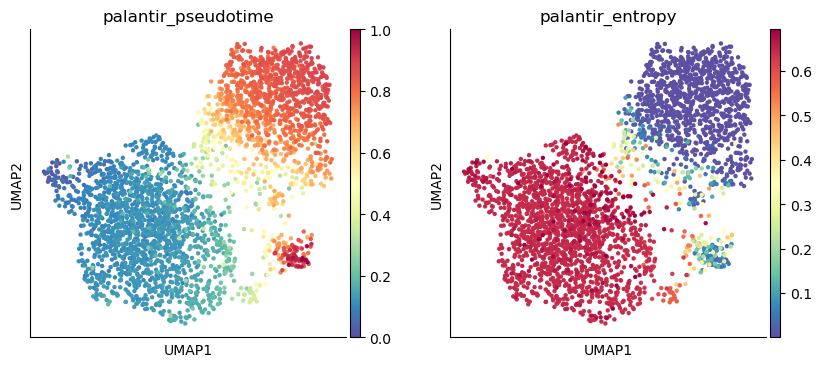

In [53]:
sc.pl.umap(adata_p123, color=['palantir_pseudotime', 'palantir_entropy'], cmap='Spectral_r', save = 'palantir_entropy.pdf', show = True)

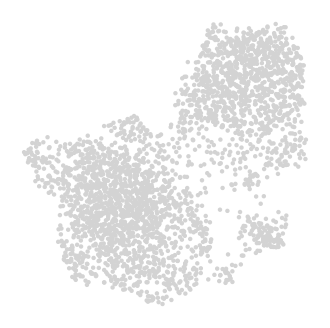

In [54]:
sc.pl.embedding(
    adata_p123,
    basis="umap",
    frameon=False,
)

In [55]:
imputed_X = palantir.utils.run_magic_imputation(adata_p123)

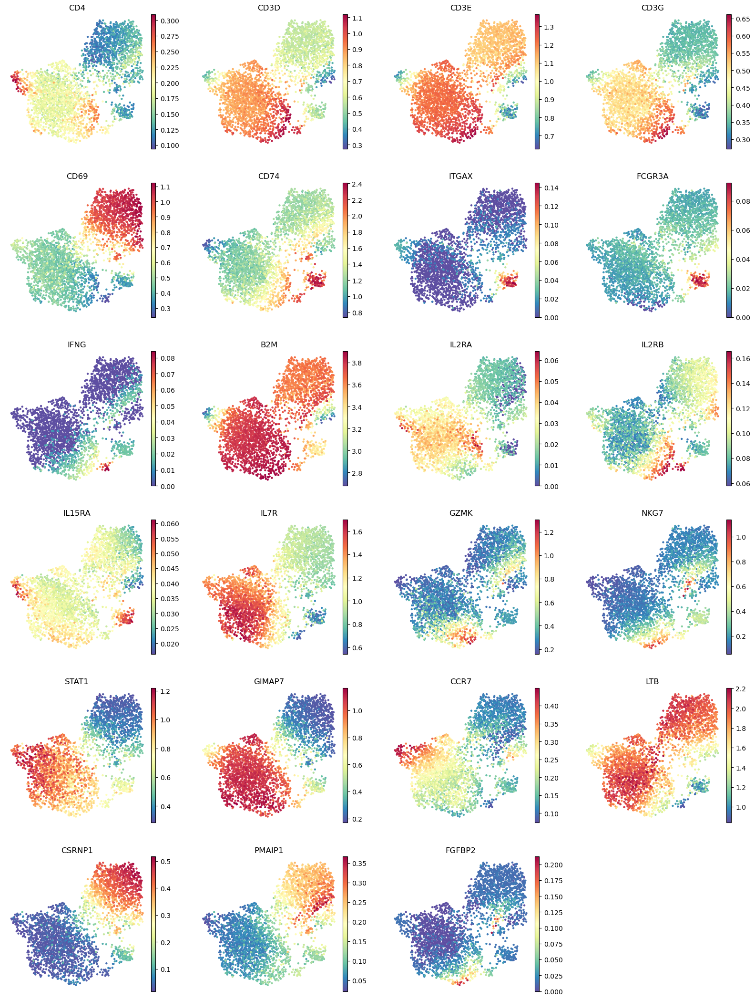

In [56]:
dup = adata_p123.obs.columns.intersection(adata_p123.var_names)
adata_p123.obs.rename(columns={c: f"{c}_obs" for c in dup}, inplace=True)

sc.pl.embedding(
    adata_p123,
    basis="umap",
    layer="MAGIC_imputed_data",
    color=["CD4", "CD3D", "CD3E", "CD3G", "CD69","CD74", "ITGAX", "FCGR3A", "IFNG", "B2M", "IL2RA", "IL2RB", "IL15RA", "IL7R", "GZMK", "NKG7", "STAT1", "GIMAP7", "CCR7", "LTB", "CSRNP1", "PMAIP1", "FGFBP2"],
    frameon=False, save = '_markers.pdf', show = True,
)
plt.show()

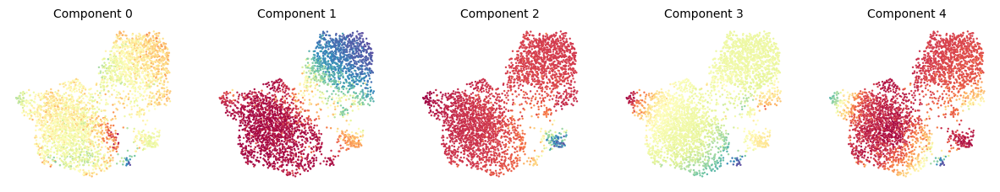

In [57]:
palantir.plot.plot_diffusion_components(adata_p123)
plt.show()

In [58]:
adata_p123.obsm['branch_masks'] = pd.DataFrame(
    {'main_branch': np.ones(adata_p123.n_obs, dtype=bool)},
    index=adata_p123.obs_names
)

In [59]:

adata_p123.obs['pseudotime'] = palantir_res.pseudotime.values

In [60]:
print(adata_p123.obs.columns)
print(adata_p123.obsm.keys())


Index(['AvgDistanceToRef', 'RNA_MERGED_clusters', 'nCount_RNA', 'nGene',
       'nUMI', 'percent.mito', 'predicted.celltype.l1',
       'predicted.celltype.l2', 'subsample', 'leiden', 'leiden_res_0.30',
       'leiden_res_0.50', 'leiden_res_0.80', 'cell_type_lvl1', 'CD69_obs',
       'IL2RA_obs', 'HLA_DR', 'STAT1_ISG_score', 'TCR_activation_score',
       'Proliferation_score', 'IFN_indep_score', 'IL1_response_score',
       'IFN_independent_score', 'Exhaustion_score', 'Senescence_score',
       'Th17_score', 'Th1_score', 'Glycolysis_score', 'Lipid_oxidation_score',
       'Central_memory_score', 'Effector_memory_score',
       'STAT_inhibitors_score', 'DNA_damage_score', 'quadrant',
       'memory_quadrant', 'pseudotime', 'palantir_pseudotime',
       'palantir_entropy'],
      dtype='object')
KeysView(AxisArrays with keys: Clusterings, Embedding, Embeddings_X, Embeddings_Y, RegulonsAUC, X_pca, X_umap, DM_EigenVectors, branch_masks)


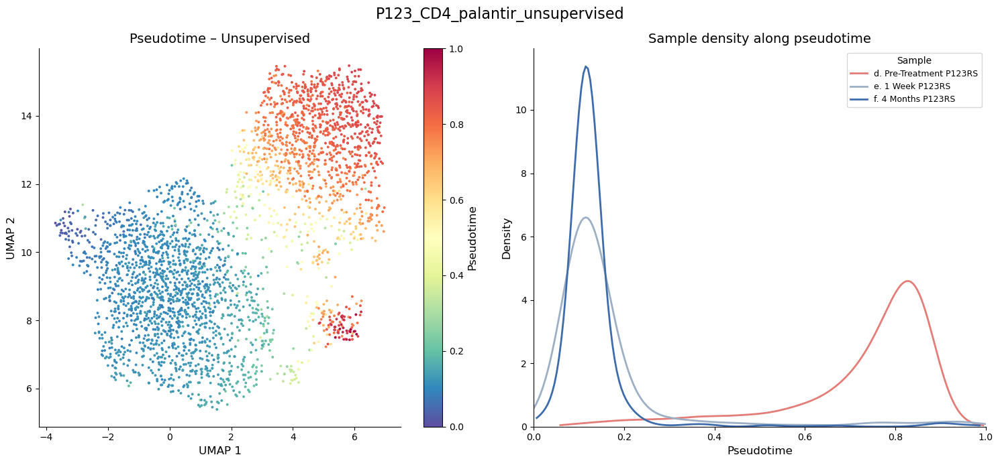

Saved: /lustre1/project/stg_00187/users/Cecilia/Data/5_Trajectory/v4/P123_CD4/P123_CD4_palantir_unsupervised.pdf


In [61]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from scipy.stats import gaussian_kde

# --------------------------------------------------
# CONFIGURATION
# --------------------------------------------------
out_dir = "/lustre1/project/stg_00187/users/Cecilia/Data/5_Trajectory/v4/P123_CD4"  # <- change if needed
sl_name = "P123_CD4_palantir_unsupervised"                                         # <- change if needed
os.makedirs(out_dir, exist_ok=True)

embedding_key = "X_umap"                # or "X_pca", "X_diffmap", etc.
X = adata_p123.obsm[embedding_key]      # shape (n_cells, 2)
sample_labels = adata_p123.obs["subsample"]

# Single (unsupervised) pseudotime vector
pseudotime = adata_p123.obs["pseudotime"].values  # <- adapt to your key

# Colormap and normalization for pseudotime
cmap = plt.get_cmap("Spectral_r")
valid = ~np.isnan(pseudotime)
norm = Normalize(vmin=np.nanmin(pseudotime[valid]), vmax=np.nanmax(pseudotime[valid]))

# --------------------------------------------------
# DEFINE COLORS FOR SUBSAMPLES (coral, gray, navy)
# --------------------------------------------------
unique_samples = sorted(sample_labels.unique())
# Assume there are exactly 3 subsamples
subsample_palette = {
    unique_samples[0]: "#e47c77",  # coral
    unique_samples[1]: "#9dafc5",  # gray
    unique_samples[2]: "#3e6cab",  # navy
}

# If you prefer explicit mapping instead of sorted order, use:
# subsample_palette = {
#     "a. Pre-Treatment P116RS": "#FF7F50",  # coral
#     "b. 1 Week P116RS":       "#808080",  # gray
#     "c. 4 Months P116RS":     "#000080",  # navy
# }

# --------------------------------------------------
# CREATE FIGURE (1x2 layout)
# --------------------------------------------------
fig, (ax_scatter, ax_density) = plt.subplots(1, 2, figsize=(15, 7))  # ~1500x750 px at 100 dpi

# -------------------------------
# LEFT: EMBEDDING COLORED BY PT
# -------------------------------
# Default: light gray for NaNs
colors = np.empty((len(pseudotime), 4))   # RGBA
colors[:] = (0.9, 0.9, 0.9, 0.3)

colors[valid] = cmap(norm(pseudotime[valid]))

sc = ax_scatter.scatter(
    X[:, 0], X[:, 1],
    c=colors,
    s=8,
    linewidths=0
)

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax_scatter)
cbar.set_label("Pseudotime", fontsize=12)

ax_scatter.set_title("Pseudotime – Unsupervised", fontsize=14)
ax_scatter.set_xlabel("UMAP 1", fontsize=12)
ax_scatter.set_ylabel("UMAP 2", fontsize=12)

# -------------------------------
# RIGHT: SAMPLE DENSITY PLOTS
# -------------------------------
densities = {}
x_min, x_max = np.inf, -np.inf
y_max = 0

for samp in sample_labels.unique():
    mask = (sample_labels == samp) & valid
    values = pseudotime[mask]

    if np.sum(mask) < 5:
        # too few points to estimate a density reliably
        continue

    kde = gaussian_kde(values)
    xs = np.linspace(values.min(), values.max(), 200)
    ys = kde(xs)

    densities[samp] = (xs, ys)

    x_min = min(x_min, xs.min())
    x_max = max(x_max, xs.max())
    y_max = max(y_max, ys.max())

if len(densities) > 0:
    ax_density.set_xlim(x_min, x_max)
    ax_density.set_ylim(0, y_max * 1.05)

    for samp, (xs, ys) in densities.items():
        # use subsample-specific color (coral, gray, navy)
        col = subsample_palette.get(samp, "#000000")
        ax_density.plot(xs, ys, linewidth=2, label=samp, color=col)

ax_density.set_xlabel("Pseudotime", fontsize=12)
ax_density.set_ylabel("Density", fontsize=12)
ax_density.set_title("Sample density along pseudotime", fontsize=14)
ax_density.legend(title="Sample", fontsize=9, title_fontsize=10)

fig.suptitle(f"{sl_name}", fontsize=16)
fig.tight_layout()

# --------------------------------------------------
# SAVE PDF
# --------------------------------------------------
out_file = os.path.join(out_dir, f"{sl_name}.pdf")
fig.savefig(out_file, bbox_inches="tight")
plt.show()
plt.close(fig)

print(f"Saved: {out_file}")


In [62]:
gene_trends = compute_gene_trends(
    adata_p123,
    lineages=['main_branch'],
    pseudo_time_key='pseudotime',
    masks_key='branch_masks'
)

main_branch
[2025-11-26 10:21:43,171] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (2,975) and rank = 1.0.
[2025-11-26 10:21:43,172] [INFO    ] Using covariance function Matern52(ls=1.0).
[2025-11-26 10:21:44,410] [INFO    ] Sigma interpreted as element-wise standard deviation.


In [63]:
import scanpy as sc
import numpy as np
import pandas as pd
import anndata 
from scipy.sparse import csr_matrix
import matplotlib.pyplot as plt

import seaborn as sns
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors

# Para pseudotime con PAGA (Scanpy tiene métodos similares a Monocle3)
import scanpy.external as sce

import palantir
import palantir.utils as utils
from sklearn.decomposition import PCA
from palantir.presults import compute_gene_trends

from pygam import GAM, s
from statsmodels.stats.multitest import multipletests
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import pdist, squareform

from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
SEED = 42
sc.settings.seed = SEED
np.random.seed(SEED)
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


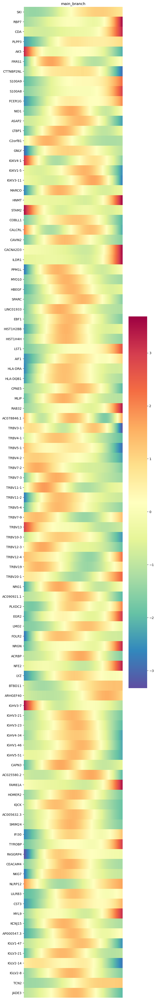

In [64]:
# Asegúrate de haber corrido este paso antes
sc.pp.highly_variable_genes(adata_p123, n_top_genes=100)

# Selecciona solo los genes marcados como altamente variables
top_genes = adata_p123.var[adata_p123.var['highly_variable']].index.tolist()

palantir.plot.plot_gene_trend_heatmaps(adata_p123, genes=top_genes)
plt.show()

In [65]:
adata_p123.obs['palantir_pseudotime'] = adata_p123.obs['pseudotime']

[2025-11-26 10:21:48,008] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (2,975) and rank = 1.0.
[2025-11-26 10:21:48,009] [INFO    ] Using covariance function Matern52(ls=0.7342914938926697).
[2025-11-26 10:21:48,010] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-11-26 10:21:48,968] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: main_branch'}>

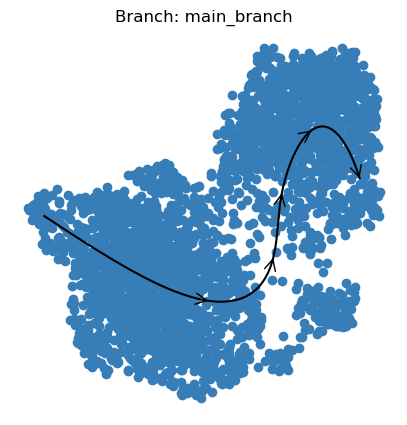

In [66]:
palantir.plot.plot_trajectory(adata_p123,"main_branch")

In [67]:
adata_p123.obs['palantir_entropy'] = palantir_res.entropy.values


[2025-11-26 10:21:49,710] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (2,975) and rank = 1.0.
[2025-11-26 10:21:49,710] [INFO    ] Using covariance function Matern52(ls=0.7342914938926697).
[2025-11-26 10:21:49,711] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-11-26 10:21:49,736] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: main_branch'}, xlabel='UMAP1', ylabel='UMAP2'>

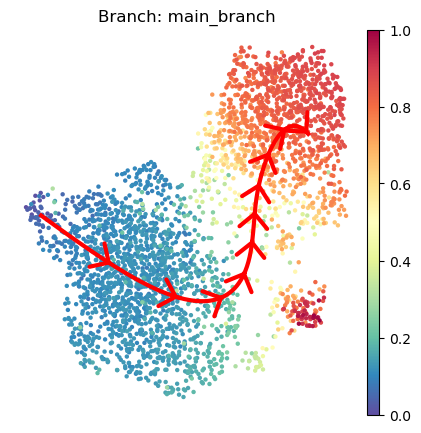

In [68]:
palantir.plot.plot_trajectory(
    adata_p123, # your anndata
    "main_branch", # the branch to plot
    cell_color="pseudotime", # the ad.obs colum to color the cells by
    n_arrows=10, # the number of arrow heads along the path
    color="red", # the color of the path and arrow heads
    scanpy_kwargs=dict(cmap="Spectral_r"), # arguments passed to scanpy.pl.embedding
    arrowprops=dict(arrowstyle="->,head_length=.5,head_width=.5", lw=3), # appearance of the arrow heads
    lw=3, # thickness of the path
    pseudotime_interval=(0, .9), # interval of the pseudotime to cover with the path
)

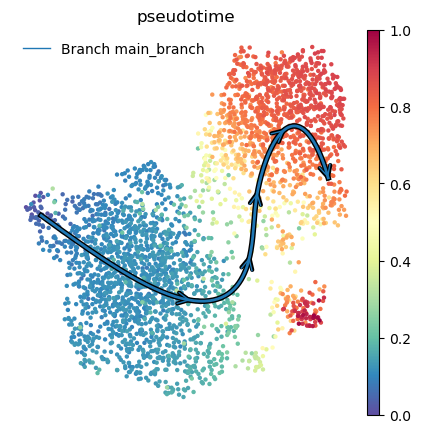

In [69]:
palantir.plot.plot_trajectories(
    adata_p123,
    cell_color='pseudotime',
    pseudotime_interval=(0, 1)
)
plt.savefig("/lustre1/project/stg_00187/users/Cecilia/Data/5_Trajectory/v4/P123_CD4/palantir_pseudotime_wArrow.pdf", dpi=300)
plt.show()

# Genes on pseudotime from unique branch

In [70]:
adata_p123

AnnData object with n_obs × n_vars = 2975 × 16358
    obs: 'AvgDistanceToRef', 'RNA_MERGED_clusters', 'nCount_RNA', 'nGene', 'nUMI', 'percent.mito', 'predicted.celltype.l1', 'predicted.celltype.l2', 'subsample', 'leiden', 'leiden_res_0.30', 'leiden_res_0.50', 'leiden_res_0.80', 'cell_type_lvl1', 'CD69_obs', 'IL2RA_obs', 'HLA_DR', 'STAT1_ISG_score', 'TCR_activation_score', 'Proliferation_score', 'IFN_indep_score', 'IL1_response_score', 'IFN_independent_score', 'Exhaustion_score', 'Senescence_score', 'Th17_score', 'Th1_score', 'Glycolysis_score', 'Lipid_oxidation_score', 'Central_memory_score', 'Effector_memory_score', 'STAT_inhibitors_score', 'DNA_damage_score', 'quadrant', 'memory_quadrant', 'pseudotime', 'palantir_pseudotime', 'palantir_entropy'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Regulons_tuples', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'subsample_colors', 'leiden', 'leiden_colors', 'leiden_res_0.30', 'leiden_res_0.50', 'lei

In [71]:
X = adata_p123.raw.X if adata_p123.raw is not None else adata_p123.X
gene_names = adata_p123.raw.var_names if adata_p123.raw is not None else adata_p123.var_names
X = pd.DataFrame(X, columns=gene_names, index=adata_p123.obs_names)

In [72]:
pseudotime = adata_p123.obs['pseudotime'].values

In [73]:
pvals = []
r2_scores = []
smooth_values = []
genes_to_test = X.columns

# Convertir pseudotime a 2D para pygam
X_pt = pseudotime.reshape(-1, 1)

# Grid común para predicción (100 puntos equiespaciados)
grid = np.linspace(X_pt.min(), X_pt.max(), 100).reshape(-1, 1)

# Ajustar modelos GAM por gen
for gene in tqdm(genes_to_test, desc="Fitting GAMs"):
    y = X[gene].values
    model = GAM(s(0)).fit(X_pt, y)
    
    pvals.append(model.statistics_['p_values'][1])
    r2_scores.append(model.statistics_['pseudo_r2']['explained_deviance'])
    
    smooth = model.predict(grid)
    smooth_values.append(smooth)


Fitting GAMs: 100%|██████████| 16358/16358 [04:12<00:00, 64.70it/s]


In [74]:
# Ajuste de p-valores
_, adj_pvals, _, _ = multipletests(pvals, method='fdr_bh')

# Guardar resultados
gam_results = pd.DataFrame({
    'gene': genes_to_test,
    'pval': pvals,
    'adj_pval': adj_pvals,
    'r2': r2_scores
}).set_index('gene')

# Filtrar por significancia (p.adj < 0.01)
significant_genes = gam_results[gam_results['adj_pval'] < 0.01].index.tolist()

# Expresiones suavizadas para genes significativos
smooth_matrix = np.array([smooth_values[i] for i, gene in enumerate(genes_to_test) if gene in significant_genes])

In [75]:
# Manhattan distance
dist_mat = pdist(smooth_matrix, metric='cityblock')
linkage_mat = linkage(dist_mat, method='average')

# Asignar clústeres
clusters = fcluster(linkage_mat, t=6, criterion='maxclust')

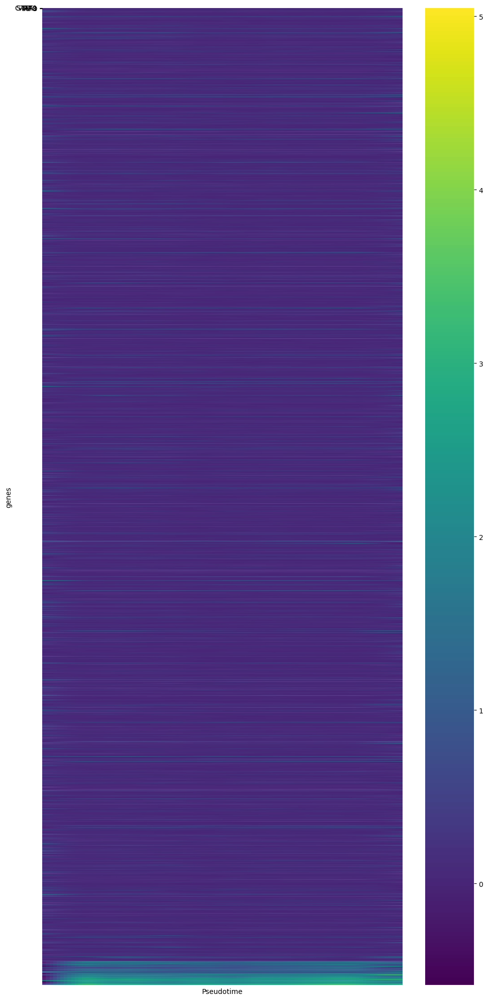

In [76]:
# Crear dataframe con anotaciones
heatmap_df = pd.DataFrame(smooth_matrix, index=significant_genes)
heatmap_df['cluster'] = clusters
heatmap_df = heatmap_df.sort_values('cluster')
heatmap_values = heatmap_df.drop(columns='cluster')

# Opcional: genes a anotar

label_genes = ["STAT1", "GATA1", "MPO", "IRF8"]
heatmap_values_filtered = heatmap_values.loc[heatmap_values.index.intersection(label_genes)]

# Generar heatmap
plt.figure(figsize=(10, 20))
sns.heatmap(
    heatmap_values,
    cmap='viridis',       
    yticklabels=label_genes,     
    xticklabels=False
)

plt.xlabel("Pseudotime")
plt.ylabel("genes")
plt.tight_layout()
plt.show()

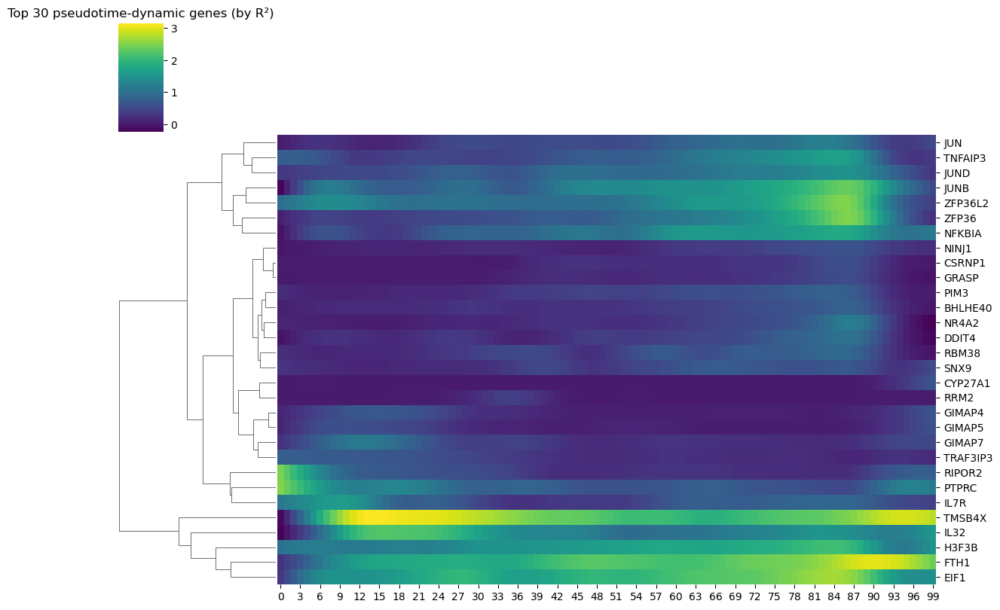

In [77]:
smooth_df = pd.DataFrame(smooth_matrix, index=significant_genes)

smooth_df_scaled = pd.DataFrame(
    StandardScaler().fit_transform(smooth_df),
    index=smooth_df.index,
    columns=smooth_df.columns
)
top_n = 30  # Muestra los 30 más dinámicos

top_genes = gam_results.loc[significant_genes].sort_values('r2', ascending=False).head(top_n).index.tolist()
filtered_df = smooth_df.loc[top_genes]

sns.clustermap(
    filtered_df,
    cmap='viridis',
    col_cluster=False,
    figsize=(12, 8),
    yticklabels=True
)
plt.title(f"Top {top_n} pseudotime-dynamic genes (by R²)")
plt.show()

In [78]:
group_map = {
    "d. Pre-Treatment P123RS": "Pre-Treatment",
    "e. 1 Week P123RS": "1 Week After",
    "f. 4 Months P123RS": "4 Months After"}

In [79]:
# Crear una columna con la fase del tratamiento
adata_p123.obs['treatment_group'] = adata_p123.obs['subsample'].map(group_map)

# Quitar células que no están en el mapeo
filtered = adata_p123.obs.dropna(subset=['treatment_group'])

# Agrupar por grupo y obtener el pseudotime promedio
group_means = filtered.groupby('treatment_group')['pseudotime'].mean()
print(group_means)

treatment_group
Pre-Treatment     0.730605
1 Week After      0.165751
4 Months After    0.132756
Name: pseudotime, dtype: float64


/tmp/ipykernel_1482857/3277691157.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_means = filtered.groupby('treatment_group')['pseudotime'].mean()


In [80]:

# Definir pseudo_lin usando la grilla existente
pseudo_lin = grid

# Asignar a cada punto el grupo más cercano según pseudotime medio
group_labels = []
for pt in pseudo_lin:
    closest_group = group_means.index[np.argmin(np.abs(group_means.values - pt))]
    group_labels.append(closest_group)

In [81]:
palette = {
    "Pre-Treatment": "#1f77b4",    # azul
    "1 Week After": "#ff7f0e",  # naranja
    "4 Months After": "#2ca02c"    # verde
}

In [82]:
col_colors = pd.Series(group_labels, index=range(100)).map(palette)

In [83]:
print(pd.Series(group_labels).value_counts())

Pre-Treatment     55
1 Week After      30
4 Months After    15
Name: count, dtype: int64


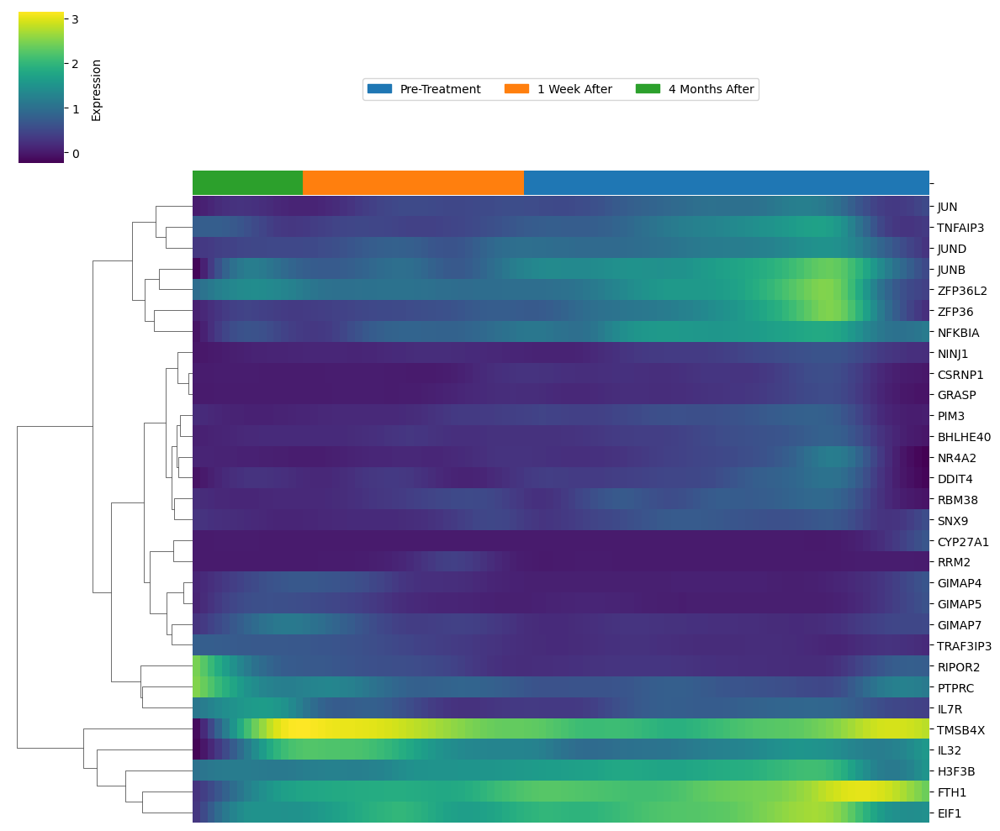

In [84]:
import matplotlib.patches as mpatches
g = sns.clustermap(
    filtered_df,
    cmap='viridis',
    col_cluster=False,
    figsize=(12, 10),
    yticklabels=True,
    xticklabels=False,
    col_colors=col_colors
)

# Agregar leyenda para los time points (col_colors)
handles_col = [
    mpatches.Patch(color=color, label=label)
    for label, color in palette.items()
]
# Leyenda para columnas (time points)
g.ax_col_dendrogram.legend(
    handles=handles_col,
    loc="center",
    bbox_to_anchor=(0.5, 0.5),
    ncol=3,
    fontsize="medium"
)
cbar = g.cax
cbar.tick_params(labelsize=10)  
cbar.set_ylabel("Expression", fontsize=10, labelpad=10)  
cbar.set_aspect(1) 
plt.show()

# Regulons along pseudotime only branch

In [85]:
regulons_array = adata_p123.uns['Regulons_tuples']
print(regulons_array.shape)

(26156,)


In [86]:
adata_p123

AnnData object with n_obs × n_vars = 2975 × 16358
    obs: 'AvgDistanceToRef', 'RNA_MERGED_clusters', 'nCount_RNA', 'nGene', 'nUMI', 'percent.mito', 'predicted.celltype.l1', 'predicted.celltype.l2', 'subsample', 'leiden', 'leiden_res_0.30', 'leiden_res_0.50', 'leiden_res_0.80', 'cell_type_lvl1', 'CD69_obs', 'IL2RA_obs', 'HLA_DR', 'STAT1_ISG_score', 'TCR_activation_score', 'Proliferation_score', 'IFN_indep_score', 'IL1_response_score', 'IFN_independent_score', 'Exhaustion_score', 'Senescence_score', 'Th17_score', 'Th1_score', 'Glycolysis_score', 'Lipid_oxidation_score', 'Central_memory_score', 'Effector_memory_score', 'STAT_inhibitors_score', 'DNA_damage_score', 'quadrant', 'memory_quadrant', 'pseudotime', 'palantir_pseudotime', 'palantir_entropy', 'treatment_group'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Regulons_tuples', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'subsample_colors', 'leiden', 'leiden_colors', 'leiden_res_0.30', 'lei

In [87]:
regulon_auc = adata_p123.obsm['RegulonsAUC']  # shape: cells x regulons


In [88]:
regulon_names = list(adata_p123.uns['Regulons_tuples'].dtype.names)
regulon_auc_df = pd.DataFrame(regulon_auc, columns=regulon_names, index=adata_p123.obs_names)
pseudotime = adata_p123.obs['pseudotime']

In [89]:
# Asegurar que los valores sean numéricos
regulon_auc_df = regulon_auc_df.apply(pd.to_numeric, errors='coerce')
# Rellenar NaNs con 0 para evitar errores en np.isnan
regulon_auc_df = regulon_auc_df.fillna(0)

In [90]:
gam_results = {}

for regulon in tqdm(regulon_auc_df.columns, desc="Fitting GAMs on regulons"):
    y = regulon_auc_df[regulon].values
    x = pseudotime.values.reshape(-1, 1)

    gam = GAM(s(0, n_splines=5)).fit(x, y)
    y_pred = gam.predict(x)

    gam_results[regulon] = {
        'model': gam,
        'y_pred': y_pred,
        'y_var': np.var(y_pred),
        'auc_range': y_pred.max() - y_pred.min()
    }

print(f"Modelados {len(gam_results)} regulones con éxito.")

Fitting GAMs on regulons: 100%|██████████| 212/212 [00:02<00:00, 81.64it/s]

Modelados 212 regulones con éxito.


In [91]:
# Crear una matriz de predicciones normalizadas
n_points = 100
pseudo_lin = np.linspace(pseudotime.min(), pseudotime.max())

smooth_df = pd.DataFrame()
for regulon, res in gam_results.items():
    y_smooth = res['model'].predict(pseudo_lin)
    smooth_df[regulon] = (y_smooth - np.mean(y_smooth)) / np.std(y_smooth)

smooth_df = smooth_df.T  # Transponer
smooth_df.index = list(gam_results.keys()) 


/tmp/ipykernel_1482857/2328324143.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  smooth_df[regulon] = (y_smooth - np.mean(y_smooth)) / np.std(y_smooth)
/tmp/ipykernel_1482857/2328324143.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  smooth_df[regulon] = (y_smooth - np.mean(y_smooth)) / np.std(y_smooth)
/tmp/ipykernel_1482857/2328324143.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at o

In [92]:
group_map = {
    "d. Pre-Treatment P123RS": "Pre-Treatment",
    "e. 1 Week P123RS": "1 Week After",
    "f. 4 Months P123RS": "4 Months After"}

In [93]:
# Crear columna de grupo de tratamiento para las células citotóxicas
adata_p123.obs["treatment_group"] = (
    adata_p123.obs["subsample"].map(group_map)
)
# Agrupar por grupo y obtener pseudotime promedio
group_means = filtered.groupby("treatment_group")["pseudotime"].mean()

print(group_means)


treatment_group
Pre-Treatment     0.730605
1 Week After      0.165751
4 Months After    0.132756
Name: pseudotime, dtype: float64


/tmp/ipykernel_1482857/3481092652.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_means = filtered.groupby("treatment_group")["pseudotime"].mean()


In [94]:
# Para cada punto en pseudo_lin, asignar el grupo de tratamiento más cercano
group_labels = []
for pt in pseudo_lin:
    closest_group = group_means.index[np.argmin(np.abs(group_means.values - pt))]
    group_labels.append(closest_group)

In [95]:
palette = {
    "Pre-Treatment": "#1f77b4",
    "1 Week After": "#ff7f0e",
    "4 Months After": "#2ca02c"
}
col_colors = pd.Series(group_labels, index=smooth_df.columns).map(palette)

/data/leuven/344/vsc34467/miniconda3/envs/scvelo_env/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


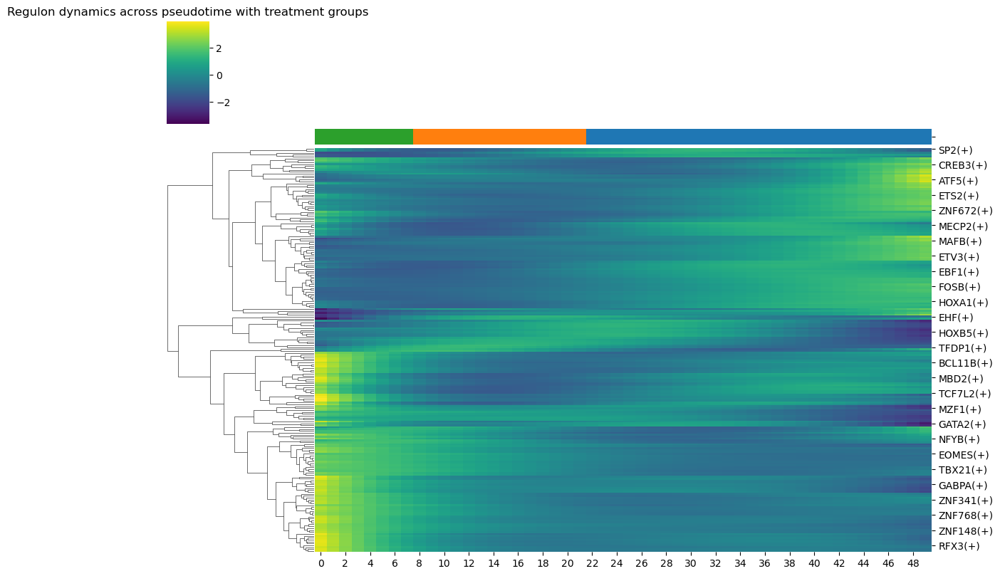

In [96]:
sns.clustermap(
    smooth_df,
    cmap='viridis',
    col_cluster=False,
    figsize=(12, 8),
    col_colors=col_colors
)
plt.title("Regulon dynamics across pseudotime with treatment groups")
plt.show()

# Complete analysis of regulons

In [97]:
# ---------------------------------------------
# 🔹 Variables iniciales
# ---------------------------------------------
pvals = []
r2_scores = []
smooth_values = []
regulons_to_test = regulon_auc_df.columns

# Convertir pseudotime a 2D para pygam
X_pt = pseudotime.values.reshape(-1, 1)

# Grid común para predicción (100 puntos equiespaciados)
grid = np.linspace(X_pt.min(), X_pt.max(), 100).reshape(-1, 1)

# ---------------------------------------------
# 🔹 Ajustar modelos GAM por regulón
# ---------------------------------------------
for regulon in tqdm(regulons_to_test, desc="Fitting GAMs on regulons"):
    y = regulon_auc_df[regulon].values

    # Evitar regulones sin varianza o con NaNs
    if np.all(y == 0) or np.var(y) == 0 or np.isnan(y).any():
        pvals.append(np.nan)
        r2_scores.append(np.nan)
        smooth_values.append(np.zeros(len(grid)))
        continue

    model = GAM(s(0)).fit(X_pt, y)

    # Guardar estadísticas
    pvals.append(model.statistics_['p_values'][1])
    r2_scores.append(model.statistics_['pseudo_r2']['explained_deviance'])

    # Predicción suavizada
    smooth = model.predict(grid)
    smooth_values.append(smooth)

# ---------------------------------------------
# 🔹 Corrección por FDR
# ---------------------------------------------
_, adj_pvals, _, _ = multipletests(
    [p for p in pvals if not np.isnan(p)],
    method='fdr_bh'
)

regulon_gam_results = pd.DataFrame({
    'regulon': regulons_to_test,
    'pval': pvals,
    'adj_pval': adj_pvals,
    'r2': r2_scores
}).set_index('regulon')

# Filtrar por significancia (p.adj < 0.01)
significant_regulons = regulon_gam_results[
    regulon_gam_results['adj_pval'] < 0.01
].index.tolist()

print(f"✅ {len(significant_regulons)} regulones significativos (adj_p < 0.01)")

# ---------------------------------------------
# 🔹 Clustering jerárquico por dinámica suavizada
# ---------------------------------------------
smooth_matrix = np.array([
    smooth_values[i] for i, r in enumerate(regulons_to_test)
    if r in significant_regulons
])

# Calcular distancias Manhattan y clustering
if len(significant_regulons) > 1:
    dist_mat = pdist(smooth_matrix, metric='cityblock')
    linkage_mat = linkage(dist_mat, method='average')
    clusters = fcluster(linkage_mat, t=6, criterion='maxclust')
    regulon_gam_results.loc[significant_regulons, 'cluster'] = clusters
else:
    linkage_mat, clusters = None, None




Fitting GAMs on regulons: 100%|██████████| 212/212 [00:03<00:00, 61.04it/s]

✅ 210 regulones significativos (adj_p < 0.01)


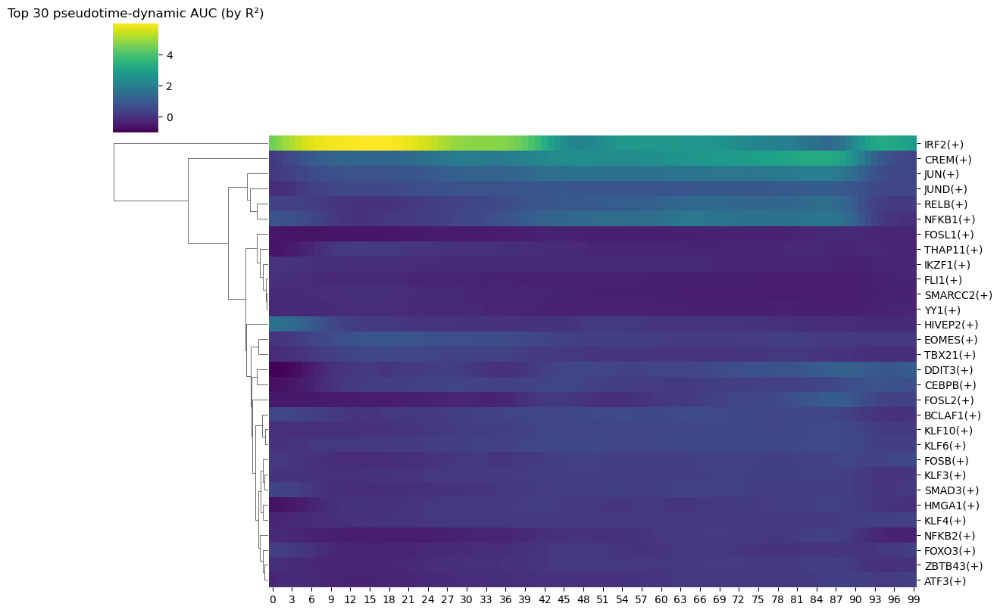

In [98]:
smooth_df_auc = pd.DataFrame(smooth_matrix, index=significant_regulons)

smooth_df__auc_scaled = pd.DataFrame(
    StandardScaler().fit_transform(smooth_df_auc),
    index=smooth_df_auc.index,
    columns=smooth_df_auc.columns
)

top_n = 30
top_regulons = (
    regulon_gam_results
    .loc[significant_regulons]
    .sort_values('r2', ascending=False)
    .head(top_n)
    .index.tolist()
)
filtered_df_auc = smooth_df__auc_scaled.loc[top_regulons]

sns.clustermap(
    filtered_df_auc,
    cmap='viridis',
    col_cluster=False,
    figsize=(12, 8),
    yticklabels=True
)
plt.title(f"Top {top_n} pseudotime-dynamic AUC (by R²)")
plt.show()

/tmp/ipykernel_1482857/1309517876.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_means = adata_p123.obs.groupby("treatment_group")["pseudotime"].mean().sort_values()


treatment_group
4 Months After    0.132756
1 Week After      0.165751
Pre-Treatment     0.730605
Name: pseudotime, dtype: float64


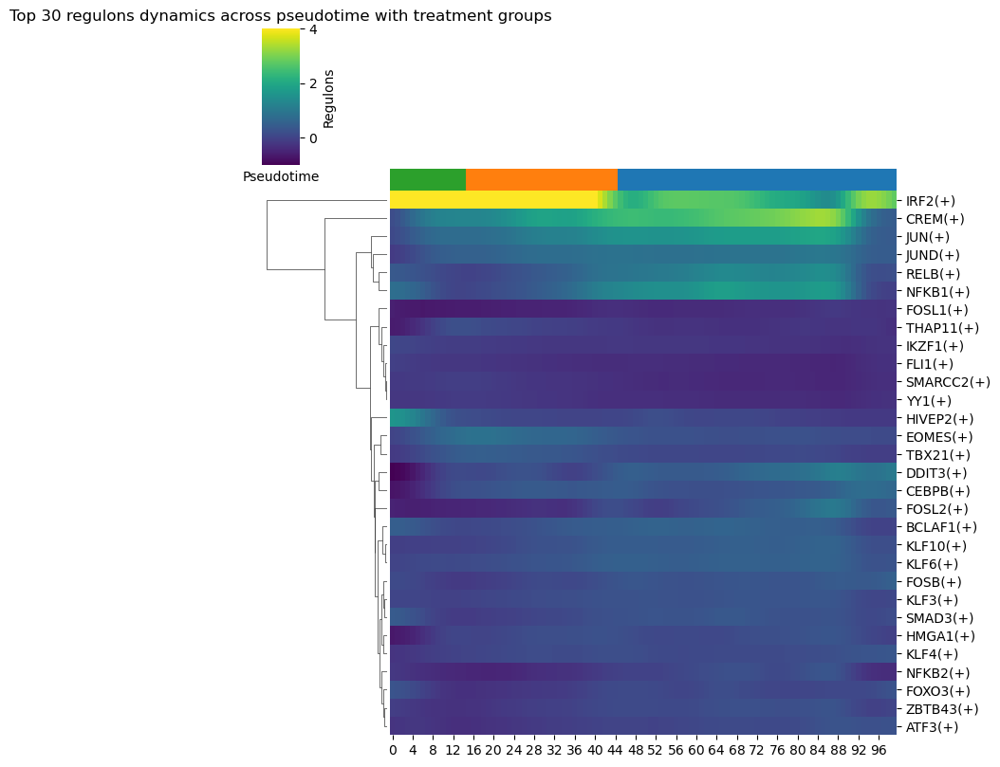

In [99]:
n_points = 100
pseudo_lin = np.linspace(pseudotime.min(), pseudotime.max(), n_points)
group_labels = []
for pt in pseudo_lin:
    closest_group = group_means.index[np.argmin(np.abs(group_means.values - pt))]
    group_labels.append(closest_group)
    
group_map = {
    "d. Pre-Treatment P123RS": "Pre-Treatment",
    "e. 1 Week P123RS": "1 Week After",
    "f. 4 Months P123RS": "4 Months After"
}

adata_p123.obs["treatment_group"] = adata_p123.obs["subsample"].map(group_map)

# Promedio de pseudotime por grupo
group_means = adata_p123.obs.groupby("treatment_group")["pseudotime"].mean().sort_values()
print(group_means)

# Asignar grupo más cercano a cada punto del pseudotime lineal
group_labels = []
for pt in pseudo_lin.flatten():
    closest_group = group_means.index[np.argmin(np.abs(group_means.values - pt))]
    group_labels.append(closest_group)

# Colores para cada grupo
palette = {
    "Pre-Treatment": "#1f77b4",
    "1 Week After": "#ff7f0e",
    "4 Months After": "#2ca02c"
}
col_colors = [palette[g] for g in group_labels]

# -----------------------------------------------------------
# 🔹 Clustermap final con colores por tratamiento
# -----------------------------------------------------------
sns.clustermap(
    filtered_df_auc,
    cmap="viridis",
    col_cluster=False,  # mantiene el orden temporal
    figsize=(8, 8),
    col_colors=col_colors,
    yticklabels=True, vmax=4
)

plt.title(f"Top {top_n} regulons dynamics across pseudotime with treatment groups")
plt.xlabel("Pseudotime")
plt.ylabel("Regulons")
plt.savefig('/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P123_CD4/heatmap_regulons_signif.pdf')
plt.show()

# Regulons one by one

In [100]:
# Filtrar células deseadas
subset_mask = adata_p123.obs['subsample'].isin(['d. Pre-Treatment P123RS','e. 1 Week P123RS', 'f. 4 Months P123RS']) # elegir las que se quiera visualizar
adata_subset = adata_p123[subset_mask]

# Subconjuntos
pseudotime_subset = pseudotime[subset_mask]
regulon_auc_subset = regulon_auc_df.loc[subset_mask]
cell_groups_subset = adata_subset.obs['subsample']  # para colorear

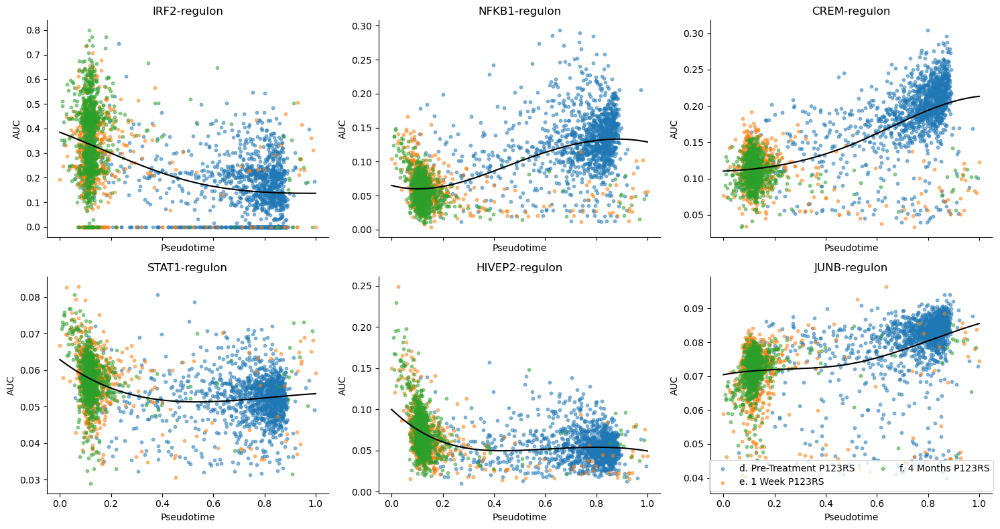

In [101]:
regulons_to_plot = ['IRF2(+)', 'NFKB1(+)', 'CREM(+)', 'STAT1(+)', 'HIVEP2(+)', 'JUNB(+)']

# Configuración de subplots
n_cols = 3
n_rows = int(np.ceil(len(regulons_to_plot) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4), sharex=True)

for idx, regulon in enumerate(regulons_to_plot):
    row, col = divmod(idx, n_cols)
    ax = axes[row, col] if n_rows > 1 else axes[col]

    x = pseudotime_subset.values
    y = regulon_auc_subset[regulon].values

    # Scatterplot por grupo celular
    for group in ['d. Pre-Treatment P123RS', 'e. 1 Week P123RS', 'f. 4 Months P123RS']: # cambiar segun 
        mask = cell_groups_subset == group
        ax.scatter(x[mask], y[mask], label=group, alpha=0.5, s=10)

    # GAM fit
    gam = GAM(s(0, n_splines=5)).fit(x.reshape(-1, 1), y)
    x_pred = np.linspace(x.min(), x.max(), 200)
    y_pred = gam.predict(x_pred)
    ax.plot(x_pred, y_pred, color='black')

    ax.set_title(f"{regulon.replace('(+)', '')}-regulon")
    ax.set_xlabel("Pseudotime")
    ax.set_ylabel("AUC")

plt.tight_layout()
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.01), ncol=2)
plt.show()


In [102]:
df = regulon_auc_subset.copy()
df["subsample"] = cell_groups_subset.values

time_map = {
    "d. Pre-Treatment P123RS": "Pre",
    "e. 1 Week P123RS": "Week1",
    "f. 4 Months P123RS": "Month4"
}

df["group"] = df["subsample"].map(time_map)


In [103]:
df["group"].value_counts()


group
Pre       1275
Month4     993
Week1      707
Name: count, dtype: int64

In [104]:
from scipy.stats import kruskal
import pandas as pd
import numpy as np

kw_results = []

for regulon in regulon_auc_subset.columns:
    d_pre   = df[df["group"] == "Pre"][regulon]
    d_w1    = df[df["group"] == "Week1"][regulon]
    d_m4    = df[df["group"] == "Month4"][regulon]

    stat, p = kruskal(d_pre, d_w1, d_m4)
    kw_results.append([regulon, stat, p])

kw_df = pd.DataFrame(kw_results, columns=["regulon", "Kruskal_stat", "p"])


In [105]:
from statsmodels.stats.multitest import multipletests
kw_df["padj"] = multipletests(kw_df["p"], method="fdr_bh")[1]


In [106]:
kw_df = kw_df.sort_values("padj")
kw_df.head()


,regulon,Kruskal_stat,p,padj
22,CREM(+),1544.561846,0.0,0.0
39,EOMES(+),1542.711583,0.0,0.0
50,FOSL1(+),1648.927164,0.0,0.0
122,NFKB1(+),1581.464392,0.0,0.0
98,KLF6(+),1451.870939,0.0,0.0


In [107]:
from scipy.stats import mannwhitneyu

pairs = [
    ("Pre", "Week1"),
    ("Pre", "Month4"),
    ("Week1", "Month4")
]

pw_results = []

for regulon in regulon_auc_subset.columns:
    for g1, g2 in pairs:
        d1 = df[df["group"] == g1][regulon]
        d2 = df[df["group"] == g2][regulon]

        stat, p = mannwhitneyu(d1, d2, alternative="two-sided")
        effect = d2.mean() - d1.mean()

        pw_results.append([regulon, g1, g2, effect, p])

pw_df = pd.DataFrame(pw_results, columns=["regulon", "group1", "group2", "effect", "p"])
pw_df["padj"] = multipletests(pw_df["p"], method="fdr_bh")[1]


/tmp/ipykernel_1482857/2827535717.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  pivot = df.groupby("group")[regulon_auc_subset.columns].mean()


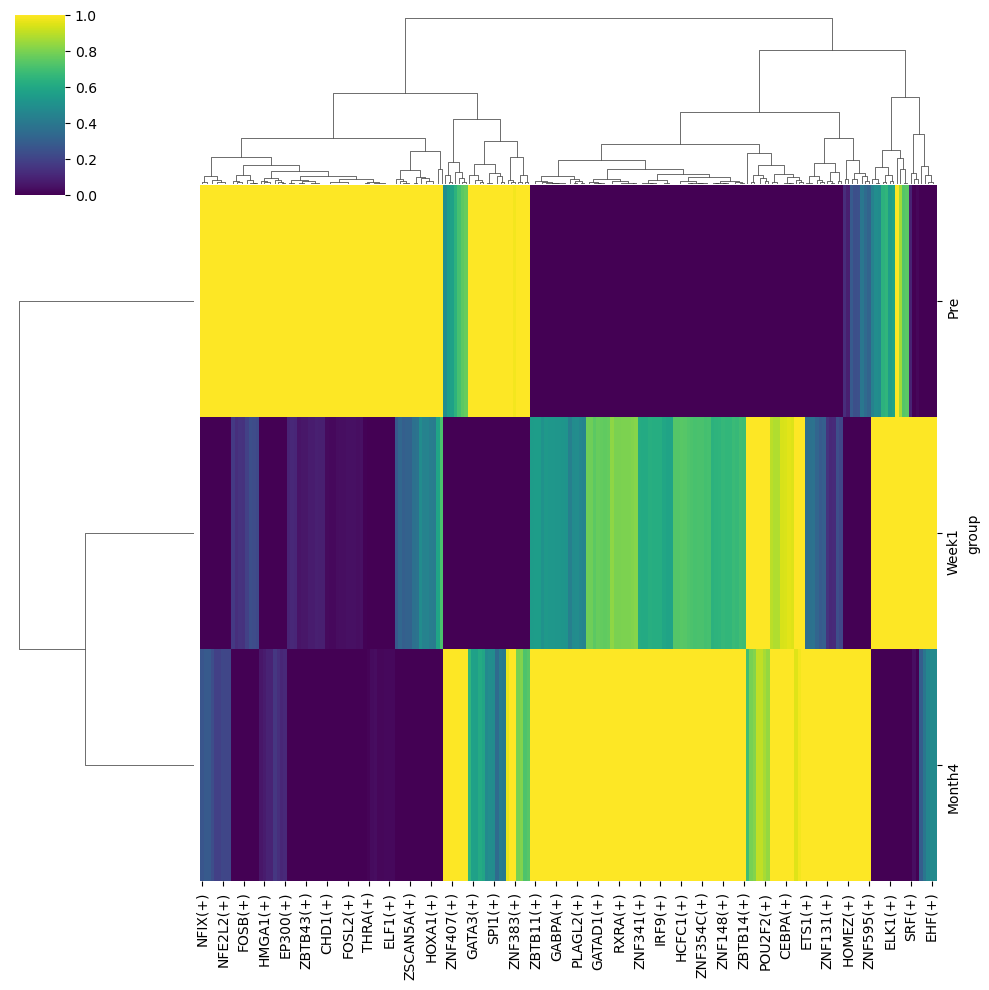

In [108]:
import seaborn as sns
pivot = df.groupby("group")[regulon_auc_subset.columns].mean()
sns.clustermap(pivot, cmap="viridis", standard_scale=1)


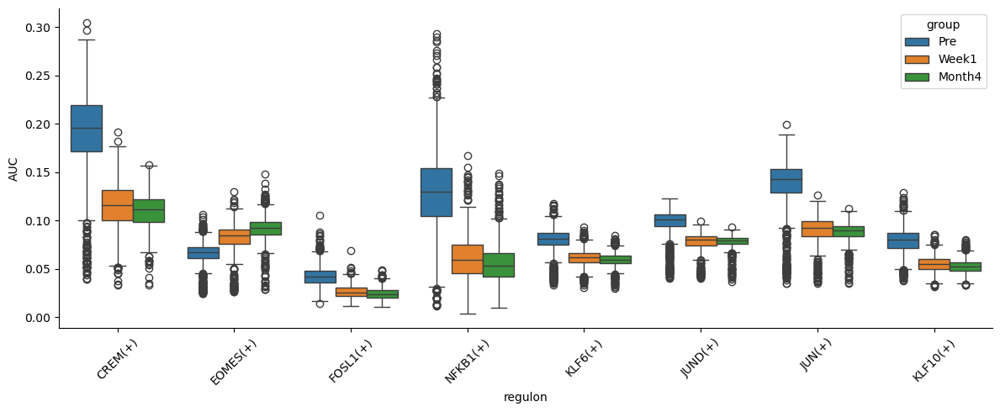

In [109]:
top = kw_df.head(8)["regulon"].tolist()
df_plot = df.melt(id_vars=["group"], value_vars=top, var_name="regulon", value_name="AUC")

plt.figure(figsize=(12, 5))
sns.boxplot(data=df_plot, x="regulon", y="AUC", hue="group")
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("/lustre1/project/stg_00187/users/Cecilia/P123_CD8_boxplot_regulons.pdf")
plt.show()


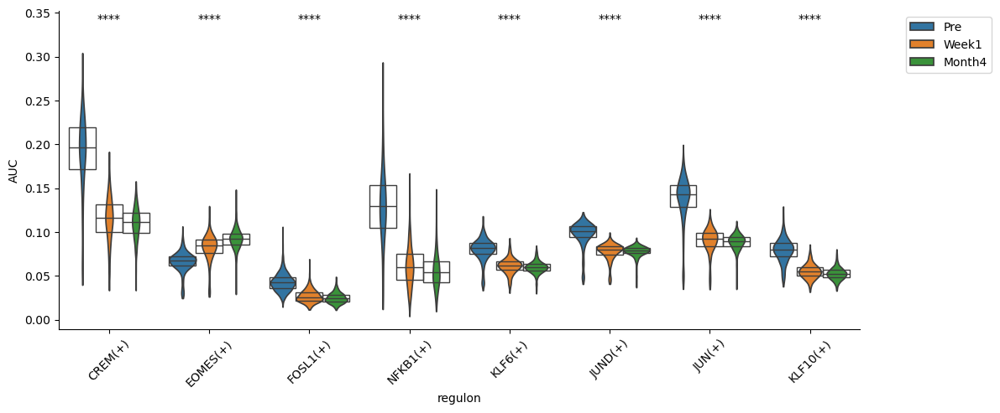

    regulon  KW_p
0   CREM(+)   0.0
1  EOMES(+)   0.0
2  FOSL1(+)   0.0
3  NFKB1(+)   0.0
4   KLF6(+)   0.0
5   JUND(+)   0.0
6    JUN(+)   0.0
7  KLF10(+)   0.0


In [110]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import kruskal

# Top regulons from your KW results
top = kw_df.head(8)["regulon"].tolist()

df_plot = df.melt(
    id_vars=["group"],
    value_vars=top,
    var_name="regulon",
    value_name="AUC"
)

groups_order = ["Pre", "Week1", "Month4"]  # adapt if needed

# ---------- Compute KW p-values per regulon ----------
pvals_kw = {}

for reg in top:
    data_reg = df_plot[df_plot["regulon"] == reg]

    samples = [
        data_reg.loc[data_reg["group"] == g, "AUC"].values
        for g in groups_order
        if (data_reg["group"] == g).any()
    ]

    stat, p = kruskal(*samples)
    pvals_kw[reg] = p

# ---------- Helper: p-value → significance stars ----------
def p_to_stars(p):
    if p < 0.0001:
        return "****"
    elif p < 0.001:
        return "***"
    elif p < 0.01:
        return "**"
    elif p < 0.05:
        return "*"
    else:
        return "ns"

# ---------- Plot ----------
plt.figure(figsize=(12, 5))

ax = sns.violinplot(
    data=df_plot,
    x="regulon",
    y="AUC",
    hue="group",
    order=top,
    hue_order=groups_order,
    cut=0,
    inner=None   # cleaner violins
)

# Optional: overlay boxplot medians
sns.boxplot(
    data=df_plot,
    x="regulon",
    y="AUC",
    hue="group",
    order=top,
    hue_order=groups_order,
    showcaps=False,
    boxprops={'facecolor':'none', "zorder":3},
    showfliers=False,
    whiskerprops={'linewidth':0},
    ax=ax
)

# Remove duplicated legend from overlay
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:len(groups_order)], labels[:len(groups_order)],
          bbox_to_anchor=(1.05, 1), loc="upper left")

plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("/lustre1/project/stg_00187/users/Cecilia/P123_CD8_violinplot_regulons.pdf")


# ---------- Add significance stars ----------
y_min, y_max = ax.get_ylim()
y_offset = (y_max - y_min) * 0.05

for i, reg in enumerate(top):
    p = pvals_kw[reg]
    stars = p_to_stars(p)

    ax.text(
        i,                       # x position
        y_max + y_offset,        # y above violin
        stars,
        ha="center",
        va="bottom",
        fontsize=10,
        color="black"
    )

ax.set_ylim(y_min, y_max + 2 * y_offset)

plt.show()

# Optional table:
kw_top = pd.DataFrame({"regulon": top, "KW_p": [pvals_kw[r] for r in top]})
print(kw_top.sort_values("KW_p"))



=== Kruskal–Wallis (global) per regulon ===
    regulon  KW_p KW_stars
0   CREM(+)   0.0     ****
1  EOMES(+)   0.0     ****
2  FOSL1(+)   0.0     ****
3  NFKB1(+)   0.0     ****
4   KLF6(+)   0.0     ****
5   JUND(+)   0.0     ****
6    JUN(+)   0.0     ****
7  KLF10(+)   0.0     ****

=== Dunn post-hoc pairwise comparisons (Bonferroni-adjusted) ===
     regulon       comparison          p_adj stars
1    CREM(+)    Pre vs Month4  1.045277e-279  ****
0    CREM(+)     Pre vs Week1  1.241565e-185  ****
2    CREM(+)  Week1 vs Month4   7.109875e-03    **
4   EOMES(+)    Pre vs Month4   0.000000e+00  ****
3   EOMES(+)     Pre vs Week1  7.037254e-114  ****
5   EOMES(+)  Week1 vs Month4   1.635447e-29  ****
7   FOSL1(+)    Pre vs Month4  2.311614e-306  ****
6   FOSL1(+)     Pre vs Week1  2.279297e-187  ****
8   FOSL1(+)  Week1 vs Month4   4.083145e-05  ****
19    JUN(+)    Pre vs Month4  3.524873e-296  ****
18    JUN(+)     Pre vs Week1  4.405074e-191  ****
20    JUN(+)  Week1 vs Month4   1.

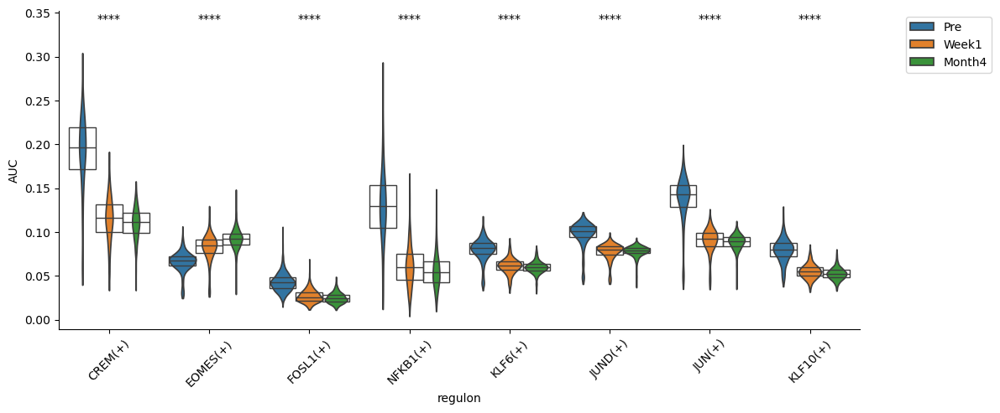

In [111]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import kruskal
import scikit_posthocs as sp  # NEW: for Dunn's test

# Top regulons from your KW results
top = kw_df.head(8)["regulon"].tolist()

df_plot = df.melt(
    id_vars=["group"],
    value_vars=top,
    var_name="regulon",
    value_name="AUC"
)

groups_order = ["Pre", "Week1", "Month4"]  # adapt if needed

# ---------- Helper: p-value → significance stars ----------
def p_to_stars(p):
    if p < 0.0001:
        return "****"
    elif p < 0.001:
        return "***"
    elif p < 0.01:
        return "**"
    elif p < 0.05:
        return "*"
    else:
        return "ns"

# ---------- 1) Global KW p-values per regulon ----------
pvals_kw = {}

for reg in top:
    data_reg = df_plot[df_plot["regulon"] == reg]

    samples = [
        data_reg.loc[data_reg["group"] == g, "AUC"].values
        for g in groups_order
        if (data_reg["group"] == g).any()
    ]

    stat, p = kruskal(*samples)
    pvals_kw[reg] = p

# ---------- 2) Post-hoc multiple comparisons (Dunn's test) ----------
pairwise_rows = []

for reg in top:
    data_reg = df_plot[(df_plot["regulon"] == reg) &
                       (df_plot["group"].isin(groups_order))].copy()

    # Dunn's test with Bonferroni correction
    dunn = sp.posthoc_dunn(
        data_reg,
        val_col="AUC",
        group_col="group",
        p_adjust="bonferroni"
    )

    # Collect pairwise results (upper triangle only)
    for i, g1 in enumerate(groups_order):
        for j, g2 in enumerate(groups_order):
            if j <= i:
                continue
            p_adj = dunn.loc[g1, g2]
            pairwise_rows.append({
                "regulon": reg,
                "comparison": f"{g1} vs {g2}",
                "p_adj": p_adj,
                "stars": p_to_stars(p_adj)
            })

pairwise_df = pd.DataFrame(pairwise_rows)

# Optional: quick overview
print("\n=== Kruskal–Wallis (global) per regulon ===")
kw_top = pd.DataFrame({
    "regulon": top,
    "KW_p": [pvals_kw[r] for r in top],
    "KW_stars": [p_to_stars(pvals_kw[r]) for r in top]
})
print(kw_top.sort_values("KW_p"))

print("\n=== Dunn post-hoc pairwise comparisons (Bonferroni-adjusted) ===")
print(pairwise_df.sort_values(["regulon", "p_adj"]))


# ---------- 3) Plot (same as you had) + KW stars ----------
plt.figure(figsize=(12, 5))

ax = sns.violinplot(
    data=df_plot,
    x="regulon",
    y="AUC",
    hue="group",
    order=top,
    hue_order=groups_order,
    cut=0,
    inner=None   # cleaner violins
)

# Overlay boxplot medians
sns.boxplot(
    data=df_plot,
    x="regulon",
    y="AUC",
    hue="group",
    order=top,
    hue_order=groups_order,
    showcaps=False,
    boxprops={'facecolor': 'none', "zorder": 3},
    showfliers=False,
    whiskerprops={'linewidth': 0},
    ax=ax
)

# Remove duplicated legend from overlay
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:len(groups_order)], labels[:len(groups_order)],
          bbox_to_anchor=(1.05, 1), loc="upper left")

plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("/lustre1/project/stg_00187/users/Cecilia/P123_CD8_violinplot_regulons.pdf")

# ---------- Add KW significance stars above each regulon ----------
y_min, y_max = ax.get_ylim()
y_offset = (y_max - y_min) * 0.05

for i, reg in enumerate(top):
    p = pvals_kw[reg]
    stars = p_to_stars(p)

    ax.text(
        i,                       # x position (center of regulon)
        y_max + y_offset,        # y above violins
        stars,
        ha="center",
        va="bottom",
        fontsize=10,
        color="black"
    )

ax.set_ylim(y_min, y_max + 2 * y_offset)

plt.show()
